# Importing libraries

In [1]:
# Importing general libraries for plotting and dealing with data
import random
import pandas as pd
import numpy as np 
import math
import matplotlib.pyplot as plt
from datetime import date

# Importing sklearns methods
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# One hot encoder functions

In [2]:
def easter_sunday(year):
    # Input: A year
    # Output: The month and day when easter sunday occurs in the year
    # Source: https://en.wikipedia.org/wiki/Computus
    a = year % 19
    b = math.floor(year / 100)
    c = year % 100
    d = math.floor(b / 4)
    e = b % 4
    f = math.floor((b + 8) / 25)
    g = math.floor((b - f + 1) / 3)
    h = (19*a + b - d - g + 15) % 30
    i = math.floor(c / 4)
    k = c % 4
    l = (32 + 2*e + 2* i - h - k) % 7
    m = math.floor((a + 11*h + 22*l) / 451)
    month = math.floor((h + l - 7*m + 114) / 31)
    day = (h + l - 7*m + 114) % 31
    day = day + 1
    eastersunday = [day, month]
    return eastersunday

In [3]:
def is_date_holiday(X_row):
    # Input: A single sample of feature data
    # Ouput: Wether or not the sample corresponds to a holiday
    
    # Our date is the first 3 features.
    # data_val[1] is the month, date_val[2] is the day of the month.
    date_val = X_row[:3]
    
    # Condition for summer. (Between the 15th of June and the 15th of August)
    if date_val[1] == 6 and date_val[2] >= 15 or  date_val[1] == 7 or date_val[1] == 8 and date_val[2] <= 15:
        holiday_status = 'Summer'
    
    # Condition for christmas. (Between the 20th of December and the 3rd of January)
    elif date_val[1] == 12 and date_val[2] >= 20 or date_val[1] == 1 and date_val[2] <= 3:
        holiday_status = 'Christmas'
    
    # Condition for spring. (General value between the 22nd of March and the 25th of April)
    elif date_val[1] == 3 and date_val[2] >= 22 or date_val[1] == 4 and date_val[2] <= 25:
        holiday_status = 'Spring'
    
    # If we are in none of these, we dont have a holiday
    else:
        holiday_status = False

    return holiday_status

In [4]:
def is_date_holiday(X_row):
    # Input: A single sample of feature data
    # Ouput: Wether or not the sample corresponds to a holiday
    
    # Our date is the first 3 features.
    # date_val[0] is the year, data_val[1] is the month, date_val[2] is the day of the month.
    date_val = X_row[:3]
    
    # Extra stuff needed for spring
    # Easter starts about 7 days before Easter sunday and 1 day after Easter sunday.
    # We need to account for changes in month in case we reach negative values in days, or a value greater than 31.
    eastersunday = easter_sunday(date_val[0])
    easter_lower_lim = eastersunday[0] - 7
    easter_upper_lim = eastersunday[0] + 1
    easter_month_lower = eastersunday[1]
    easter_month_upper = eastersunday[1]
    if easter_lower_lim <= 0:
        easter_month_lower = eastersunday[1] - 1
        easter_lower_lim = easter_lower_lim + 31
    if easter_upper_lim > 31:
        easter_month_upper = eastersunday[1] + 1
        easter_lower_lim = easter_lower_lim - 31
    
    
    # Condition for summer. (Between the 15th of June and the 15th of August)r
    if date_val[1] == 6 and date_val[2] >= 15 or  date_val[1] == 7 or date_val[1] == 8 and date_val[2] <= 15:
        holiday_status = 'Summer'
    
    # Condition for christmas. (Between the 20th of December and the 3rd of January)
    elif date_val[1] == 12 and date_val[2] >= 20 or date_val[1] == 1 and date_val[2] <= 3:
        holiday_status = 'Christmas'
    
    # Condition for spring. (A bit more complicated, depends on when Easter sunday is)  
    elif date_val[1] == easter_month_upper and easter_upper_lim - 1 <= date_val[2] <= easter_upper_lim or date_val[1] == easter_month_lower and date_val[2] >= easter_lower_lim:
        holiday_status = 'Spring'
    
    # If we are in none of these, we dont have a holiday
    else:
        holiday_status = False

    return holiday_status

In [5]:
def is_date_weekend(X_row):
    # Input: A single sample of feature data
    # Ouput: Wether or not the sample corresponds to a weekend
    
    # Our date is the first 3 features.
    date_val = X_row[:3]
    
    # Retrieve what day of the week the sample is located at. The date().weekday() function outputs an integer
    # between 0 an 6 depending on the weekday given a date.
    weekday = date(date_val[0],date_val[1],date_val[2]).weekday()

    weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    
    # If we are in a weekend, we return 1, otherwise 0
    if weekday_names[weekday] == 'Saturday' or weekday_names[weekday] == 'Sunday':
        weekend_status = int(1)
    else:
        weekend_status = int(0)
        
    return weekend_status


In [6]:
def is_date_rush_hour(X_row):
    # Input: A single sample of feature data
    # Ouput: Wether or not the sample corresponds to rush-hour
    
    # Get the hour from the current sample
    hour = X_row[3]
    
    # If the hour of the sample is inbetween 6AM and 8AM or between 14PM to 16PM then we are in rush-hour.
    if 6 <= hour <= 8 or 14 <= hour <= 16:
        rush_hour_status = int(1)   
    else:
        rush_hour_status = int(0)
    
    return rush_hour_status

In [7]:
def is_date_daytime(X_row):
    # Input: A single sample of feature data
    # Ouput: Wether or not the sample corresponds to daytime
    
    # Get the hour from the current sample
    hour = X_row[3]
    
    # If the hour is inbetween 22PM and 4AM then we are in nighttime.
    if 22 <= hour or hour <= 4:
        daytime_status = int(0)   
    else:
        daytime_status = int(1)
     
    return daytime_status

In [8]:
def modify_features_onehot(X, weekends=True, holidays=True, rush_hours=True, daytimes=True):
    # Input: Feature data, and which extra features you want to add
    # Output: A modified feature data matrix
    
    # We want to add 0's to all days which are regular workdays and 1's for weekends.
    # Let us also add 1's for the holidays. 1's for rush hour and 1's for daytime.
    # This is because we can see that the traffic is considerably less for weekends and holidays, 
    # and a lot higher for rush hour and daytime. Thus we want the regressor to have
    # extra features to correspond the traffic values to.
    
    # Initializing the new columns to append to the feature matrix X
    # Need to force the array to be integers only.
    weekend_column = np.array([], dtype=int)
    holiday_column = np.array([], dtype=int)
    rush_hour_column = np.array([], dtype=int)
    daytime_column = np.array([], dtype=int)
    
    # Initialize the modified X matrix as X.
    modified_X = X
    
    # Check if X is one sample (one row) or multiple samples.
    n_dims = X.ndim
    
    # If X is one dimensional, then there is only one sample. And we run a special condition.
    if n_dims == 1:
        
        X_row = X
        
        if weekends == True:
            # Check if sample is weekend, append status to weekend column.
            weekend_status = is_date_weekend(X_row)
            weekend_column = np.append(weekend_column, weekend_status)
        
        if holidays == True:
            # Check if sample is during a holiday, append status to holiday column.
            # If holiday_satus is something other than false, append 1 to the holiday column.
            # Else we append 0.
            holiday_status = is_date_holiday(X_row)
            if holiday_status != False:
                holiday_column = np.append(holiday_column, int(1))

            elif holiday_status == False:
                holiday_column = np.append(holiday_column, int(0))
        
        if rush_hours == True:
            # Check if sample is during rush-hour, append the status to rush-hour column.
            rush_hour_status = is_date_rush_hour(X_row)
            rush_hour_column = np.append(rush_hour_column, rush_hour_status)
        
        if daytimes == True:
            # Check if sample is during daytime, append the status to daytime column.
            daytime_status = is_date_daytime(X_row)
            daytime_column = np.append(daytime_column, daytime_status)
            
            # Append new columns to the modified feature data.
        if weekends == True:
            modified_X = np.append(modified_X, weekend_column, axis=0)
        if holidays == True:
            modified_X = np.append(modified_X, holiday_column, axis=0)
        if rush_hours == True:
            modified_X = np.append(modified_X, rush_hour_column, axis=0)
        if daytimes == True:
            modified_X = np.append(modified_X, daytime_column, axis=0)
        
        return modified_X
    
    # If we have multiple samples, we continue by looping over all samples.
    # The code below works the same as above.
    
    for row in range(len(X)):
        
        X_row = X[row]
        
        if weekends == True:
            # Check if sample is weekend, append status to weekend column.
            weekend_status = is_date_weekend(X_row)
            weekend_column = np.append(weekend_column, weekend_status)
        
        if holidays == True:
            # Check if sample is during a holiday, append status to holiday column.
            # If holiday_satus is something other than false, append 1 to the holiday column.
            # Else we append 0.
            holiday_status = is_date_holiday(X_row)
            if holiday_status != False:
                holiday_column = np.append(holiday_column, int(1))

            elif holiday_status == False:
                holiday_column = np.append(holiday_column, int(0))
        
        if rush_hours == True:
            # Check if sample is during rush-hour, append the status to rush-hour column.
            rush_hour_status = is_date_rush_hour(X_row)
            rush_hour_column = np.append(rush_hour_column, rush_hour_status)
        
        if daytimes == True:
            # Check if sample is during daytime, append the status to daytime column.
            daytime_status = is_date_daytime(X_row)
            daytime_column = np.append(daytime_column, daytime_status)
    
    
    # Append new columns to the modified feature data.
    if weekends == True:
        modified_X = np.append(modified_X, weekend_column[:,None], axis=1)
    if holidays == True:
        modified_X = np.append(modified_X, holiday_column[:,None], axis=1)
    if rush_hours == True:
        modified_X = np.append(modified_X, rush_hour_column[:,None], axis=1)
    if daytimes == True:
        modified_X = np.append(modified_X, daytime_column[:,None], axis=1)
    
    return modified_X

# Other helper Functions

In [9]:
def data_splitter(X,y):
    # Input: X feature matrix, y target matrix
    # Ouput: Training, testing and validation data
    
    # I define a function which can split our dataset into training-, validation- and testdata.
    # It does NOT shuffle the data before splitting.                 
    
    # Shuffle and split the data into train and a concatenation of validation and test sets
    X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size=0.3, shuffle=False)
    
    # Shuffle and split the data into validation and test sets
    X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.5, shuffle=False)                                                                   

    return X_train, X_val, X_test, y_train, y_val, y_test

In [10]:
def plot_holiday_domains(X):
    # Input: All feature data
    # Output: Vertical lines in plot corresponding to holidays
    
    # Line height on plot
    ymax = 0.2
    ymin = 0.0
    
    # Set the current holiday status as the first day in the dataset
    holiday_current = is_date_holiday(X[0])
    for i in range(len(X)):

        holiday_status = is_date_holiday(X[i])
        
        # If the holiday status changes, we check what holiday we are in and then plot the corresponding vertical line
        if holiday_status != holiday_current:
            if holiday_status == 'Summer':
                plt.axvline(x=i, color='red', ymin=ymin, ymax=ymax)
                previous_color = 'red'
                holiday_current = holiday_status

            elif holiday_status == 'Spring':
                plt.axvline(x=i, color='yellow', ymin=ymin, ymax=ymax)
                previous_color = 'yellow'
                holiday_current = holiday_status
                
            elif holiday_status == 'Christmas':    
                plt.axvline(x=i, color='green', ymin=ymin, ymax=ymax)
                previous_color = 'green'
                holiday_current = holiday_status

            elif holiday_status == False:
                plt.axvline(x=i, color=previous_color, ymin=ymin, ymax=ymax)
                holiday_current = holiday_status

    

# The trainer-evaluator-plotter function

In [11]:
def train_eval_plot_model(model_list, X_train, y_train_coln, X_val, y_val_coln, week=1):
    # Input: A list of different sklearn estimators, training data + targets and validation data + targets
    # Output: The best model found and the best score achieved
    
    # Initialize the best score achieved
    best_score = 0

    # Loop through all of the hyperparameters and save the best model
    for model in model_list:

        # Train and evaluate model
        model.fit(X_train, y_train_coln)
        score = model.score(X_val, y_val_coln)

        # If the current score is better than the previous best score, save the current model and its hyperparameters
        if score >= best_score:
            best_score = score
            best_model = model
    
    # Variables for plotting local patterns
    week = 1
    n_start = 100 + (week-1)*168
    n_end = 100 + week*168

    # Get predictions
    y_predictions = best_model.predict(X_val)

    # Make a figure with the predictions and validation data (local)
    plt.figure(figsize=(20,10))

    plt.title('Predicted vs actual validation values (Weekly)')
    plt.plot(y_val_coln[n_start:n_end], label='Validation data')
    plt.plot(y_predictions[n_start:n_end], c='r', marker='.', label='Sklearn model prediction')
    plt.legend()
    plt.show()

    # Make a figure with the predictions and validation data (global)
    plt.figure(figsize=(20,10))

    plt.title('Predicted vs actual validation values (Global)')
    plt.plot(y_val_coln[:], label='Validation data')
    plt.plot(y_predictions[:], c='r', marker='.', label='Sklearn model prediction', alpha=0.4)
    plt.legend()
    plt.show()
    
    return best_model, best_score

# 1.1 Data

## Loading the main dataset

We load the main dataset by first storing it as a pandas dataframe, then converting it into a numpy array. The pandas dataframe is only used for printing as it also gives the names of the relevant columns.

In [12]:
# Load the dataset as a pandas dataframe
dataset = pd.read_csv('data.csv')

# Extract features to a pandas dataframe X then convert to a numpy array
X = dataset.iloc[:,:-3].to_numpy()

# Extract features to a pandas dataframe y then convert to a numpy array
y = dataset.iloc[:,-3:].to_numpy()

print('Number of samples: ', X.shape[0])
print('Number of features: ', X.shape[-1])
print('Number of targets: ', y.shape[-1])

Number of samples:  35192
Number of features:  4
Number of targets:  3


Let us get a feel for what the data looks like;

In [13]:
print(dataset)

         År  Måned  Dag  Fra_time  Volum til SNTR  Volum til DNP  Volum totalt
0      2015     12   16        11             265            232           497
1      2015     12   16        12             243            223           466
2      2015     12   16        13             251            289           540
3      2015     12   16        14             369            409           778
4      2015     12   16        15             283            365           648
...     ...    ...  ...       ...             ...            ...           ...
35187  2019     12   31        19              77             72           149
35188  2019     12   31        20              58             61           119
35189  2019     12   31        21              52             51           103
35190  2019     12   31        22              51             39            90
35191  2019     12   31        23              34             81           115

[35192 rows x 7 columns]


# 1.2 Preprocessing

## 1.2.1 Visualizing the data

To get a better understanding of how the features affect the target values, i will visualize the data. Since this dataset is quite large (over 35 thousand samples), i will have a look at both local (weekly) structure, and global (yearly) structure seperately.

We know that we have three different sets of target values. The volume of cars heading towards the center, 'Volum_til_SNTR', the volume of cars heading to Danmarksplass, 'Volum_til_DNP' and the total volume of cars per hour 'Volum_totalt'. These targets occupy columns 0, 1 and 2 respectively in the target matrix y.

## Global patterns

Let us first look at the global patterns of the three targets:

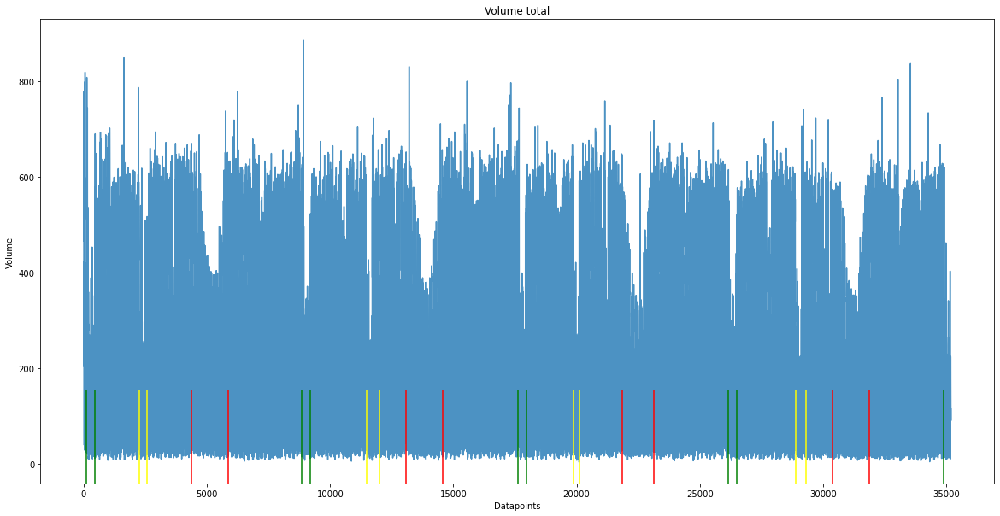

In [14]:
# Initialize a figure of certain size
plt.figure(figsize=(20,10))

# Plot the targets in column 2 of the target matrix
plt.plot(y[:,2], alpha=0.8)

# Set labels and title
plt.xlabel('Datapoints')
plt.ylabel('Volume')
plt.title('Volume total')

# Plot the domains of holidays
plot_holiday_domains(X)
  
plt.show()

Here we see the total volume of cars from 16th of December 2015 to 31st of December 2019. I have plotted vertical lines containing the domains of the largest holidays. A pair of green lines display the christmas holidays lasting from the 20th of December to the 3rd of January. A pair of yellow lines describe the approximate location of easter holidays lasting somewhere between the 22nd of March to the 25th of April. A pair of red lines describe the summer holidays, lasting from the 15th of June to the 15th of August. 

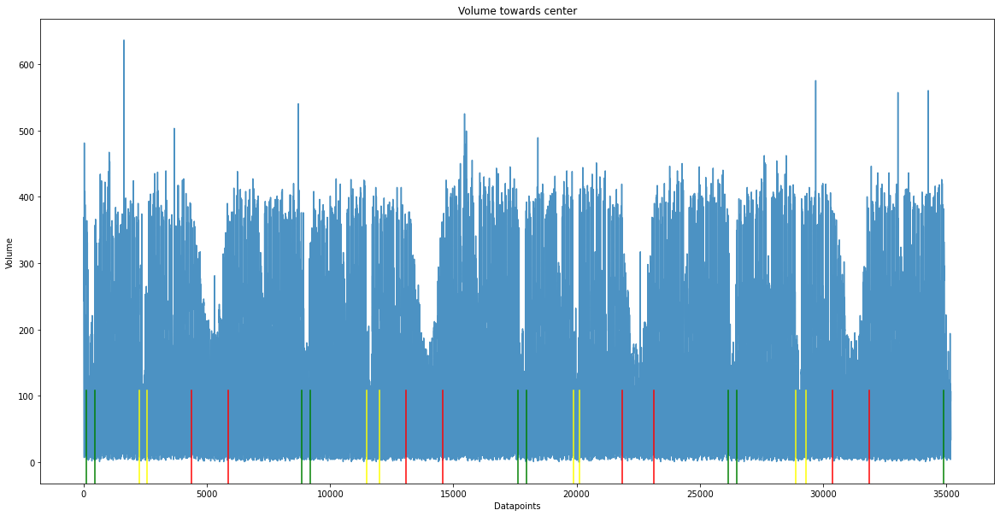

In [15]:
# Initialize a figure of certain size
plt.figure(figsize=(20,10))

# Plot the targets in column 0 of the target matrix
plt.plot(y[:,0], alpha=0.8)

# Set labels and title
plt.xlabel('Datapoints')
plt.ylabel('Volume')
plt.title('Volume towards center')

# Plot the domains of holidays
plot_holiday_domains(X)

plt.show()

We see that the peaks of the volumes stay relatively consistent around 400 except for the holiday periods. 

Now we do the same for the other target value, the volume towards Danmarksplass.

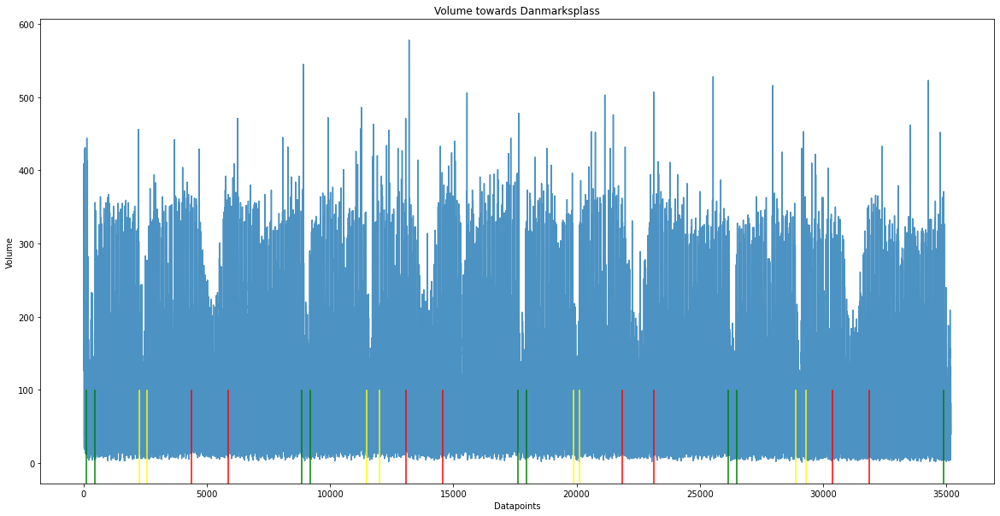

In [16]:
# Initialize a figure of certain size
plt.figure(figsize=(20,10))

# Plot the targets in column 1 of the target matrix
plt.plot(y[:,1], alpha=0.8)

# Set labels and title
plt.xlabel('Datapoints')
plt.ylabel('Volume')
plt.title('Volume towards Danmarksplass')

# Plot the domains of holidays
plot_holiday_domains(X)
  
plt.show()

Here we see the same sort of patterns. Peaks remain constant around 350, but dip whenever there is a holiday.

## Weekly patterns

Now i want to look at the weekly patternings. There are a lot of weeks to choose from, but I will select an arbitrary week (Monday to Sunday) of the dataset as an example. Hopefully it will be general enough to show what is going on. In a week there are 7*24 = 168 hours. Thus we will look at 168 datapoints. I will skip ahead to an arbitrary week far away from any holiday

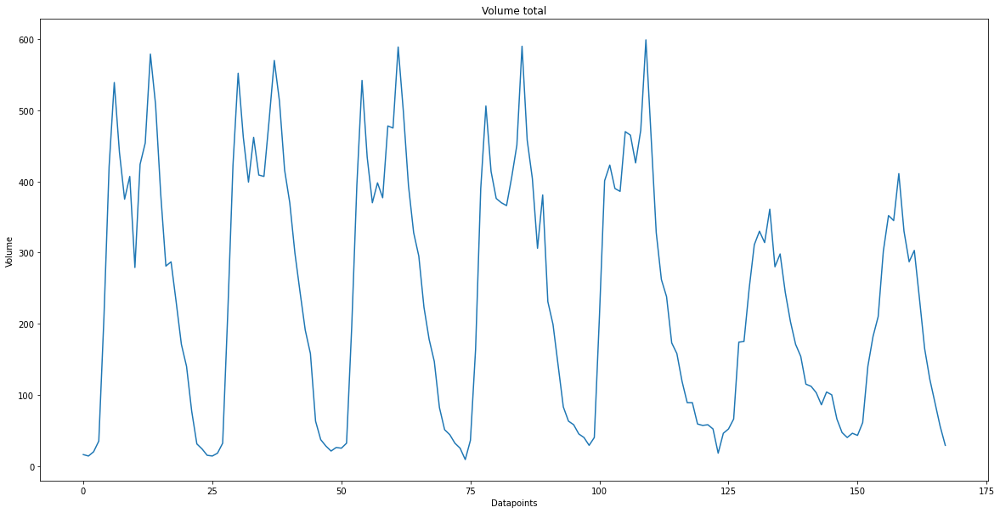

In [17]:
# Initialize a figure of certain size
plt.figure(figsize=(20,10))

# I plot the values for the 1th column between the sample #1118 and #1286 which is a weeks worth of data.
plt.plot(y[1118:1286,2], alpha=1)

# Set labels and title
plt.xlabel('Datapoints')
plt.ylabel('Volume')
plt.title('Volume total')
  
plt.show()

Here we see seven peaks. These peaks correspond to each day of the week. Also, many of the peaks contain sub-peaks. These sub-peaks correspond to rush-hour in the morning, and then rush-hour later in the afternoon. We also see that the first and second sub-peak are about the same size however this will not be the case for the other target columns. The reason why the sub-peaks are about the same size, is because there are about the same amount of cars heading towards the center in the morning, as people leaving from work in the evening.

We can also see that during the week, there are five big peaks, then two smaller ones. This corresponds to the fact, that traffic will be a lot heavier during workdays, as opposed to the weekend. 

I also plot the volumes towards Danmarksplass and the volume towards the center for the same week.

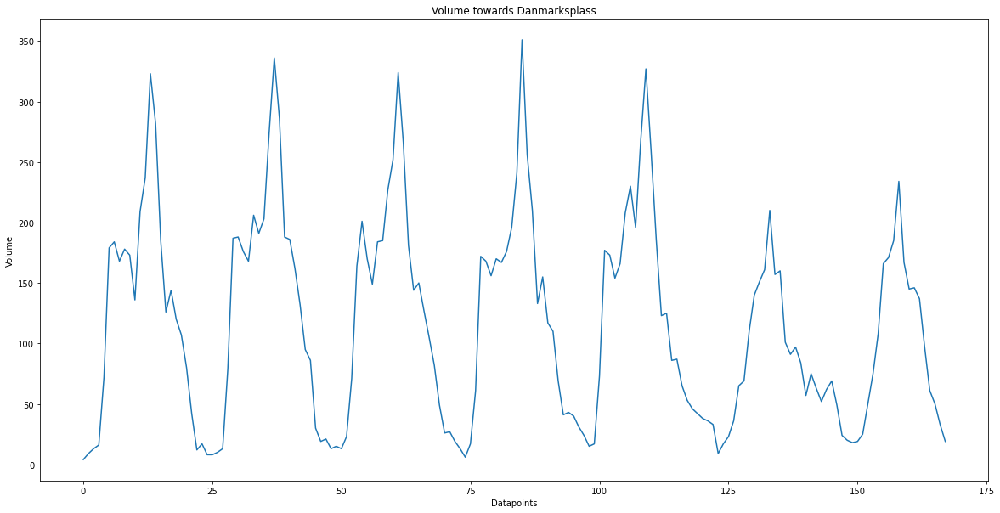

In [18]:
# Initialize a figure of certain size
plt.figure(figsize=(20,10))

# I plot the values for the 1th column between the sample #1118 and #1286 which is a weeks worth of data.
plt.plot(y[1118:1286,1], alpha=1)

# Set labels and title
plt.xlabel('Datapoints')
plt.ylabel('Volume')
plt.title('Volume towards Danmarksplass')
  
plt.show()

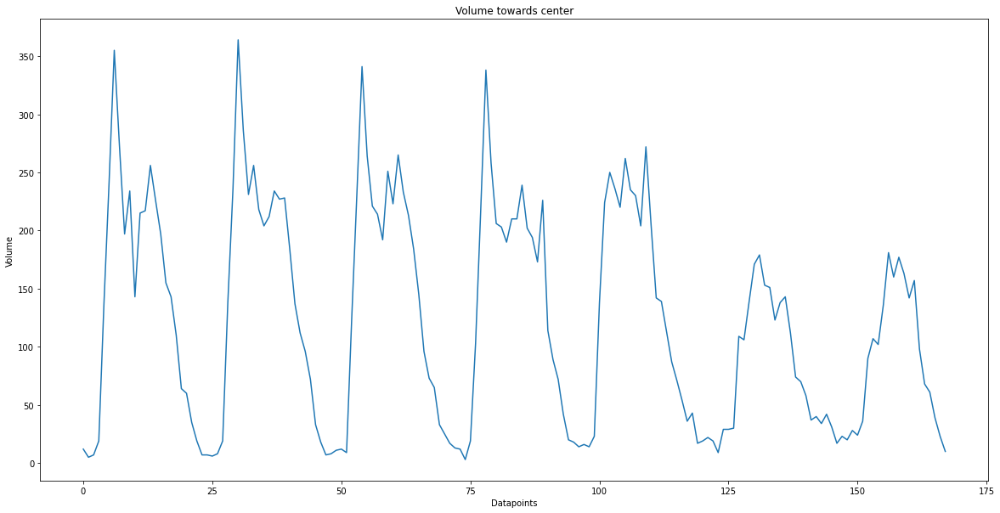

In [19]:
# Initialize a figure of certain size
plt.figure(figsize=(20,10))

# I plot the values for the 0th column between the sample #1118 and #1286 which is a weeks worth of data.
plt.plot(y[1118:1286,0], alpha=1)

# Set labels and title
plt.xlabel('Datapoints')
plt.ylabel('Volume')
plt.title('Volume towards center')
  
plt.show()

Here we see the same general patterns. The major difference is that in each peak, the first and second sub-peak differ in size significantly. This reveals that in the morning, more cars are headed towards the center, and then in the evening as people are finishing work, there are more cars headed towards Danmarksplass.

## 1.2.2 Training, validation, testing data

Now, we need to consider how to split our data X and y into training, validation and test data and targets. Our data is continous in time and thus, for plotting purposes, a single datapoint can only be appreciated together with neighboring datapoints. If we were to shuffle the dataset, then plotting would give us a mess of fluctuating values without the patterns we have looked at. I would prefer to keep my data in sequence. Thus, i will not suffle my data before splitting it. Consequently, the first years will be the training data, then the last few months will be the validation and test data respectively.  Specifically, the first 70% of data will be training data, then the next 15% + 15% will be validation and test data respectively.

This should not adversely affect the performance of the learning algorithm as we have enough datapoints to span a wide array of different dates for each dataset. And if we assume that there are no major differences in traffic between 2015-2019, then splitting this way will not make too much of a difference. This is more evident by looking at the global plot for the total volume. The traffic patterns remain somewhat consistent throughout the years.

In [20]:
X_train, X_val, X_test, y_train, y_val, y_test = data_splitter(X,y)

## 1.2.3 Onehot encoding

As we are free to modify the dataset as we wish, I might want to help the learning algorithm by adding some extra information via one-hot encoding. The idea is to add extra columns to our feature data. I think the most important features will be ones which can tell us wether or not the sample we look at is;

1. A major holiday or not. Holidays have a major effect on the average value for volume. 

2. A weekend or not. Weekends have on average a lower volume, and they tend to not have a sub-peak structure.

3. A time with high or low traffic. Rushhour has high traffic. Nighttime has very little traffic.

I will compare the score of a learning algorithm trained on unmodified data to one trained on one-hot-encoded data to justify my choices of features.

I have created a function modify_features_onehot(X, weekends, holidays, rush_hours, daytimes), which takes the featuredata X, and adds extra columns (features) to it. One column is the 'weekend' column, it contains 0s for workdays, and 1s for weekends. Another column is the 'holiday' column. It contains 0s for when the sample is not a holiday and 1s for when the sample is one of the major holidays. Then i have the 'Rush-hour' column. It contains 1s if the time is between 6-8 AM or 2-4 PM and 0s otherwise. Finally the 'daytime' column. It contains 0s for nighttime (22 PM to 4AM) and 1s otherwise.

This function also takes the arguments weekends, holidays, rush_hours and daytimes. These will by default be set to true. If any of them are false, then the corresponding column will not be added to the modified feature matrix modified_X. This was used during the prototyping phase. I would add and remove features and check which ones gave me an overall better score. I concluded that keeping all of them set to true was the best. The reason i did not have this as a part of my model selection process is that some of the estimators take several minutes to train on the data. If i were to loop through all the different possible combinations of feature data to include, a cell would take forever to complete.


In [21]:
X_modified_train = modify_features_onehot(X_train)
X_modified_val = modify_features_onehot(X_val)
X_modified_test = modify_features_onehot(X_test)

After passing the feature data, X_train for example, through this function, we get a modified featureset modified_X_train. Here is an example of what a modified featureset would look like;

In [22]:
print(X_modified_train[80:100])

[[2015   12   19   19    1    0    0    1]
 [2015   12   19   20    1    0    0    1]
 [2015   12   19   21    1    0    0    1]
 [2015   12   19   22    1    0    0    0]
 [2015   12   19   23    1    0    0    0]
 [2015   12   20    0    1    1    0    0]
 [2015   12   20    1    1    1    0    0]
 [2015   12   20    2    1    1    0    0]
 [2015   12   20    3    1    1    0    0]
 [2015   12   20    4    1    1    0    0]
 [2015   12   20    5    1    1    0    1]
 [2015   12   20    6    1    1    1    1]
 [2015   12   20    7    1    1    1    1]
 [2015   12   20    8    1    1    1    1]
 [2015   12   20    9    1    1    0    1]
 [2015   12   20   10    1    1    0    1]
 [2015   12   20   11    1    1    0    1]
 [2015   12   20   12    1    1    0    1]
 [2015   12   20   13    1    1    0    1]
 [2015   12   20   14    1    1    1    1]]


The first four columns are the dates of the samples, the last four columns are the extra discrete features ive added.

# 1.3 Modelling and evaluation

## 1.3.1 Total volume model selection

### 1.3.1 a) LinearRegression()

The first model i wanted to try was the sklearn's LinearRegression() model, by first transforming the data with PolynomialFeatures. As our target values oscillate and they are cyclical in the range 0 to 23, i thought it could be an ok model for the job. 

I create a loop which changes the degree d on each iteration and initializes a new model with these hyperparameters. I then use the train_eval_plot_model() function which will loop through all the candidate models and finds the best one. It then plots the results of this best model. 

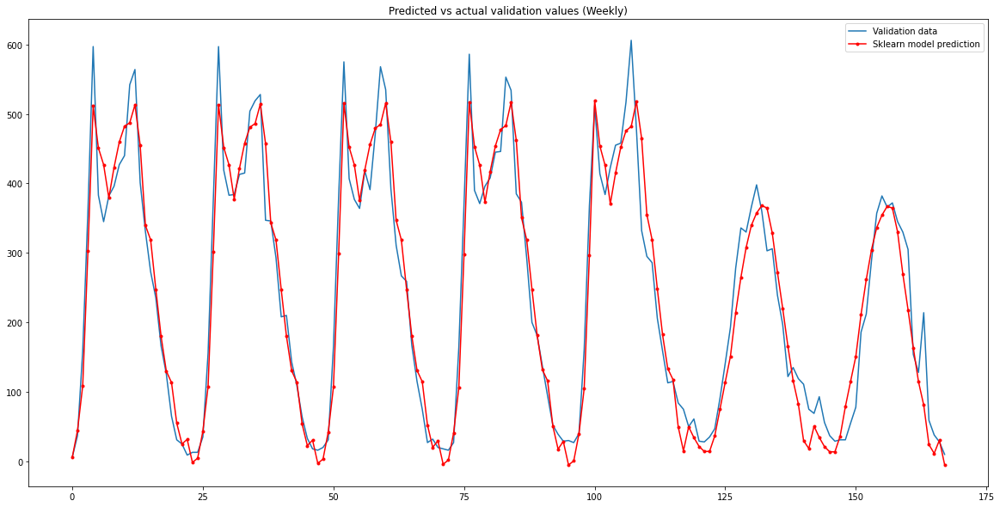

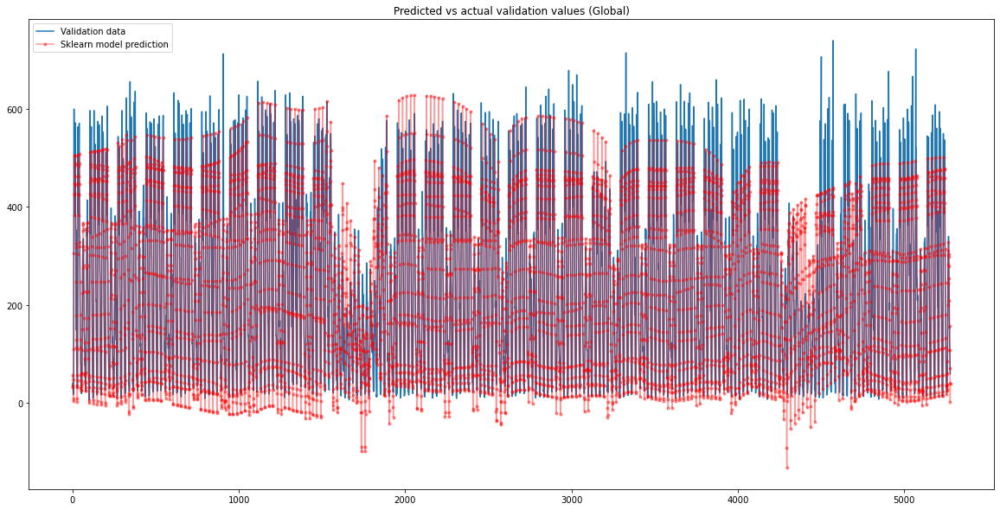

In [23]:
# Initialize a list of hyperparameters to vary
d_list = [1,2,3,4,5,6]

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,2]
y_val_coln = y_val[:,2]

# Loop through all of the hyperparameters and store each model in a list
for d in d_list:
        model_list.append(make_pipeline(PolynomialFeatures(d), LinearRegression()))
    
best_poly_model, best_poly_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

I also print the best hyperparameters and the best score achieved

In [24]:
score = best_poly_model.score(X_modified_val,y_val[:,2])

print('The best polynomial model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_poly_model.get_params(deep=False)

The best polynomial model achieved a score of: 0.8834511902500924
It achieved this score with the hyperparameters:


{'memory': None,
 'steps': [('polynomialfeatures', PolynomialFeatures(degree=5)),
  ('linearregression', LinearRegression())],
 'verbose': False}

Here we see that on our validation data, we get the best score of 0.8835. By simply looking at the local values, we could say it is close to perfect. However globally, we see that the prediction does do quite well, but not perfect. Our learner sometimes predict negative values which are obviously wrong.

## Tangent: Justification for my choice of discrete features

Why did I select weekends, holidays, rush-hour and daytime as the discrete features for onehot encoding? I simply selected them as they gave me very large increases in performance for the models that i tested. If I train the LinearRegressor model on the unmodified data, i get the following plots;

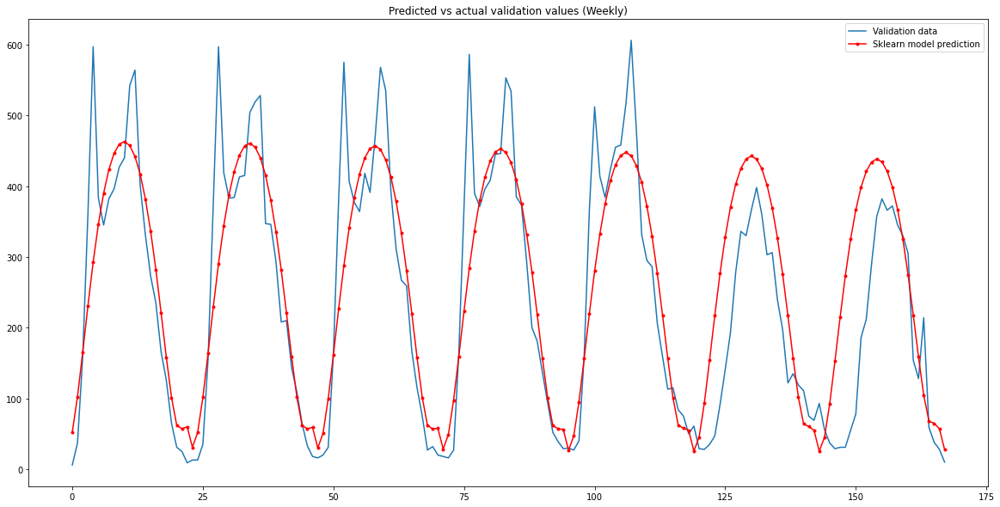

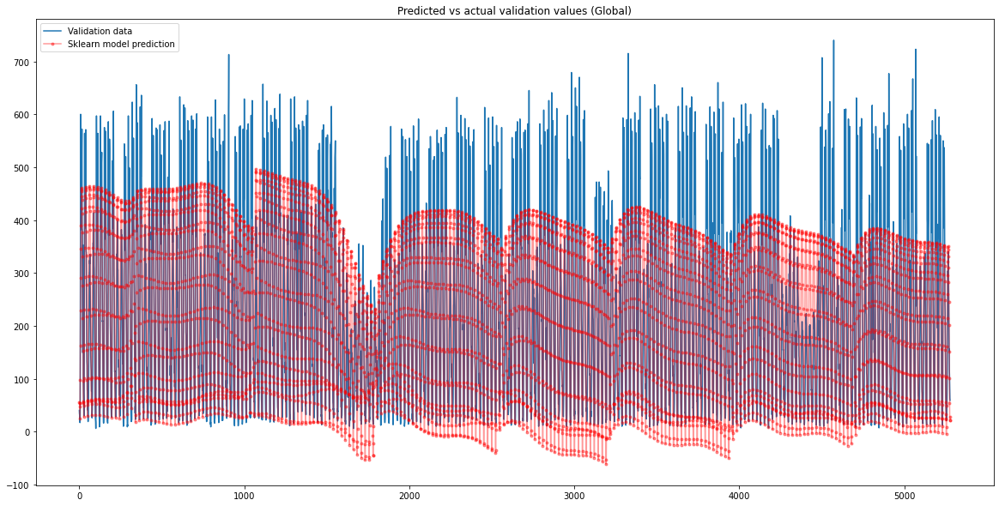

In [25]:
# Initialize a list of hyperparameters to vary
d_list = [1,2,3,4,5,6]

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,2]
y_val_coln = y_val[:,2]

# Loop through all of the hyperparameters and store each model in a list
for d in d_list:
        model_list.append(make_pipeline(PolynomialFeatures(d), LinearRegression()))
    
poly_model_ex, poly_score_ex = train_eval_plot_model(model_list, X_train, y_train_coln, X_val, y_val_coln)

We can see that it performs a lot worse. I print the score;

In [26]:
score = poly_model_ex.score(X_val,y_val[:,2])

print('The best polynomial model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
poly_model_ex.get_params(deep=False)

The best polynomial model achieved a score of: 0.6566753024080358
It achieved this score with the hyperparameters:


{'memory': None,
 'steps': [('polynomialfeatures', PolynomialFeatures(degree=6)),
  ('linearregression', LinearRegression())],
 'verbose': False}

We only get a score of 0.6567 this time. The addition of my choice of discrete features gave us an increase in score of 0.2268.

### 1.3.1 b) Decision Tree Regressor

The next regressor I wanted to try was sklearn's DecisionTreeRegressor(). I wish to do model selection on the parameter max_depth as it decides the amount of pre-pruning. The code i wrote for the model selection is largely identical to the previous bit of code. The only difference is that i loop over the hyperparameters max_depth instead. I let the maximum depths be a list covering a wide range of values [None, 500, 200, 100, 50, 20, 10, 8, 6, 4, 2]. By running the cell i get the following graphs; 

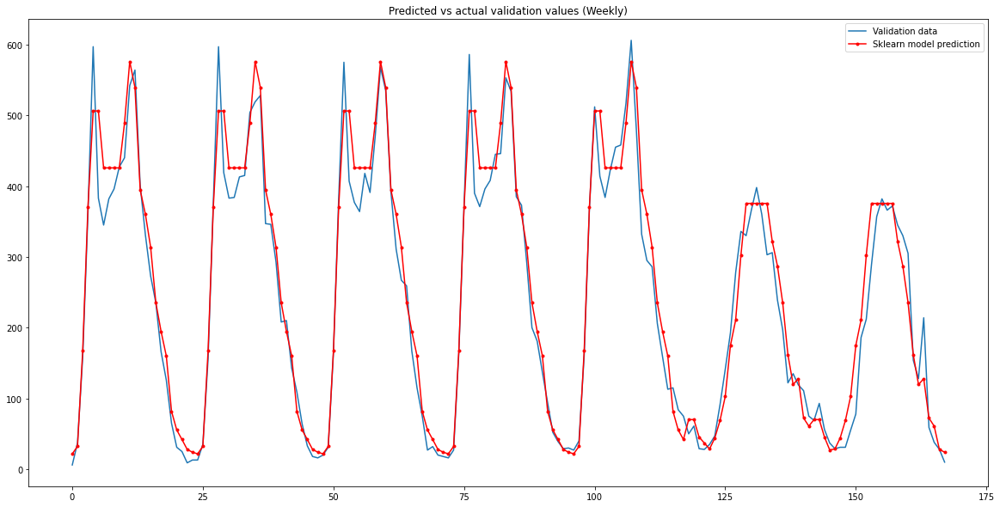

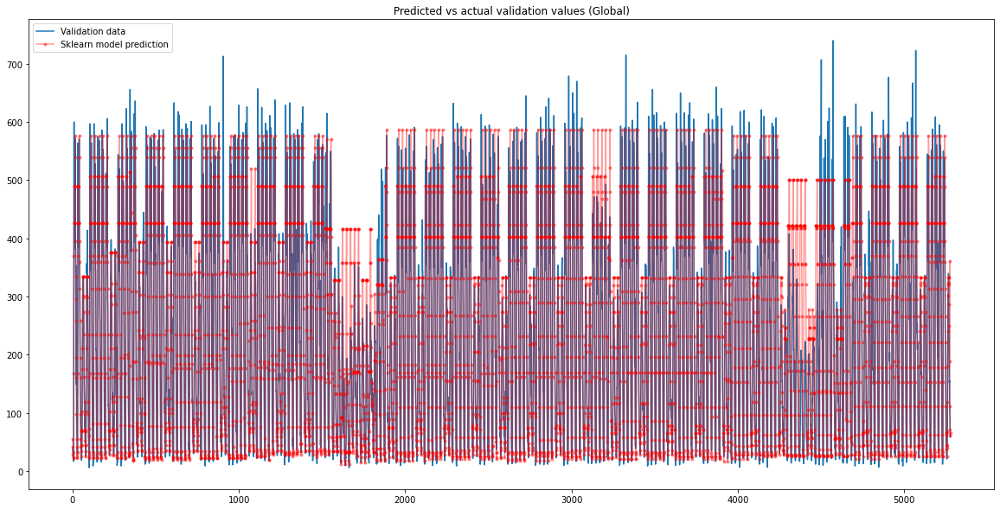

In [27]:
# Initialize a list of hyperparameters to vary
max_depth_list = [None, 500, 200, 100, 50, 20, 10, 8, 6, 4, 2]

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,2]
y_val_coln = y_val[:,2]

# Loop through all of the hyperparameters and store each model in a list
for depth in max_depth_list:
        model_list.append(tree.DecisionTreeRegressor(max_depth = depth, random_state = 0))
    
best_DTR_model, best_DTR_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In the local plot, we see that the estimator quite accurately predicts the double-peak behaviour. It is also able to capture how the shape of the Saturday/Sunday peaks are smaller and simpler. In the global plot we see that it still underestimates the rushhour peaks, but not as badly as the LinearRegressor() based model. However it still overestimates the volume during the vacations. This model does in the very least not predict negative values.

I print the score and the hyperparameters used to achieve the score;

In [28]:
score = best_DTR_model.score(X_modified_val,y_val[:,2])

print('The best Decision Tree Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_DTR_model.get_params(deep=False)

The best Decision Tree Regressor model achieved a score of: 0.8899497181242353
It achieved this score with the hyperparameters:


{'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 10,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': 0,
 'splitter': 'best'}

We now get a score of 0.8899. This is really good. But hopefully we can do even better. This score was achieved with a maximum depth of 10.

### 1.3.1 c) K Nearest Neighbors Regressor

Now i want to try a KNN Regressor. I will let the hyperparameters be the number of neighbors to account for, and how to weigh the neighbors. I let the number of neighbors vary in a list as [1, 2, 3, 4, 5, 10, 15, 20, 25], then i let the weighting vary as ['uniform', 'distance']. Here a uniform weighting means that all neighbors are equally weighted, wheras the distance weighting means that the prediction is weighted more towards near points.

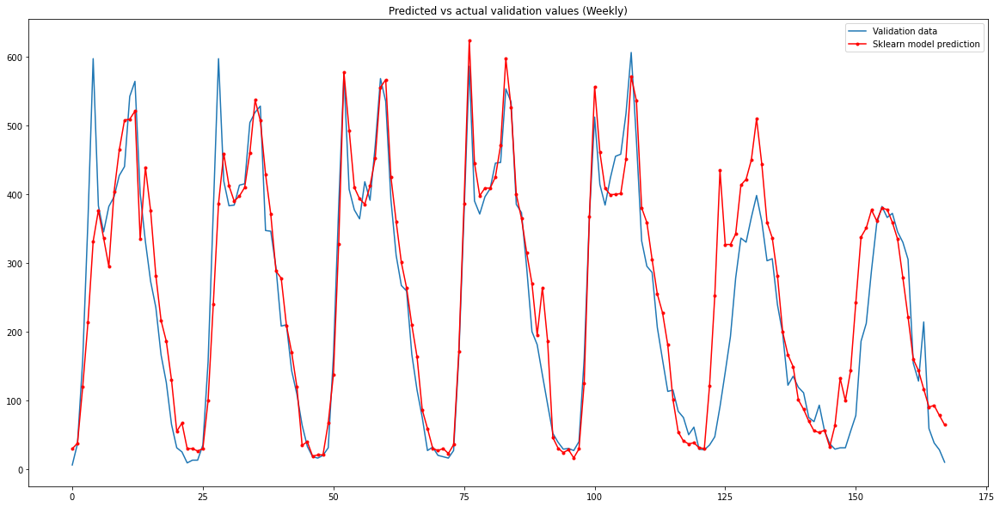

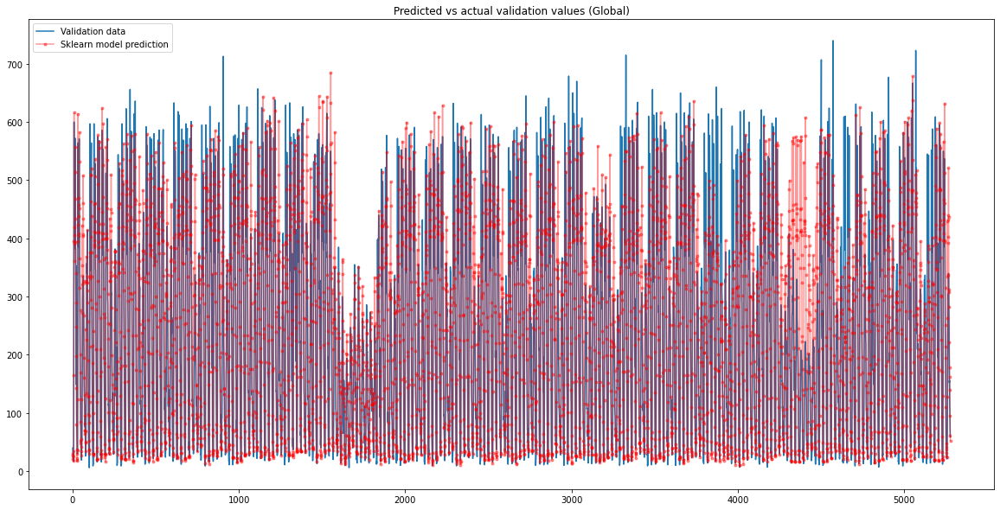

In [29]:
# Initialize a list of hyperparameters to vary
n_neighbors_list = [1, 2, 3, 4, 5, 10, 15, 20, 25]
weights_list = ['uniform', 'distance']

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,2]
y_val_coln = y_val[:,2]

# Loop through all of the hyperparameters and store each model in a list
for n in n_neighbors_list:
    for weight in weights_list:
        
        model_list.append(KNeighborsRegressor(n_neighbors=n, weights=weight))
    
best_KNNR_model, best_KNNR_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

The local plot shows us that it does not always manage to predict the correct shape for the daily peaks. In this case, the Monday peak has three peaks, and the Saturday peak has two peaks. Looking at the global plot however we see that it sometimes overestimates rushour traffic and sometimes underestimates it. Surprisingly this model almost perfectly predicted the dip of the first vacation in the validation dataset. The second one not at all however. 

In [30]:
score = best_KNNR_model.score(X_modified_val,y_val[:,2])

print('The best KNN Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_KNNR_model.get_params(deep=False)

The best KNN Regressor model achieved a score of: 0.819891865139968
It achieved this score with the hyperparameters:


{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 3,
 'p': 2,
 'weights': 'distance'}

We see that this model performs the worst so far with a score of 0.8199. It achieved this score with number of neighbors = 3 and the weighting being based on the distance.

### 1.3.1 d) Random forest regressor

Finally i would like to try a random forest regressor. I will vary the hyperparemeters for number of estimators to use, and the maximum depth to have for each tree. I let the maximum depth vary as [5, 10, 20, 25, None] and the number of estimators vary as [25, 50, 100, 150, 200, 250].

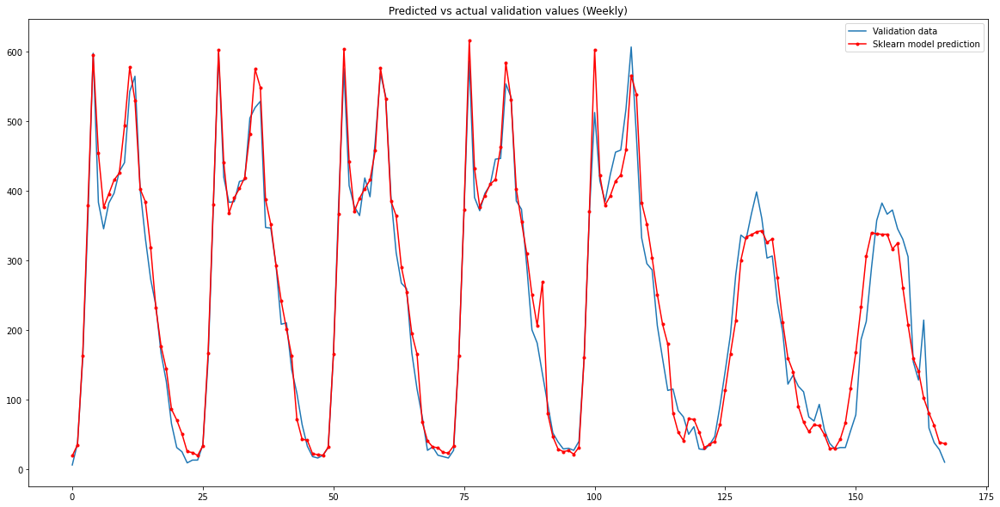

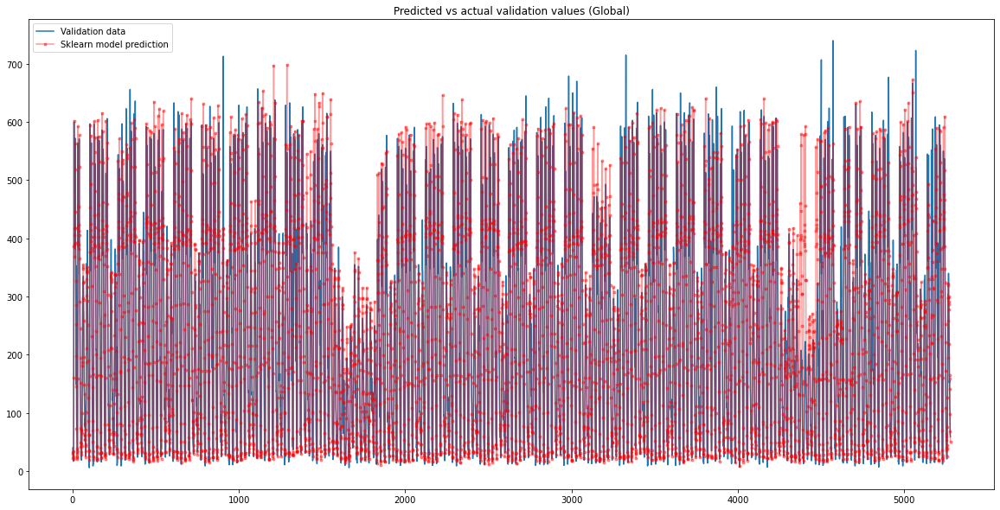

In [31]:
# Initialize a list of hyperparameters to vary
n_estimators_list = [25, 50, 100, 150, 200, 250]
max_depth_list = [5, 10, 20, 25, None]

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,2]
y_val_coln = y_val[:,2]

# Loop through all of the hyperparameters and store each model in a list
for n in n_estimators_list:
    for depth in max_depth_list:
    
        model_list.append(RandomForestRegressor(n_estimators=n, max_depth=depth, random_state=999))
    
best_RND_Forest, best_RND_Forest_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

Both the local and global plots look very promising. It just about perfectly predicts the behaviour locally. Globally it underestimates rushhour a lot less and it handled the first holiday very well, but overestimated the second vacation somewhat. 

In [32]:
score = best_RND_Forest.score(X_modified_val,y_val[:,2])

print('The best Random Forest Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_RND_Forest.get_params(deep=False)

The best Random Forest Regressor model achieved a score of: 0.9220053847883242
It achieved this score with the hyperparameters:


{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 20,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 999,
 'verbose': 0,
 'warm_start': False}

With this model i get a very good score of 0.9223. This was achieved with 200 estimators and a maximum depth of 20. This was the best score i could achieve with all of my testing. Thus i will select the Random Forest Regressor with the hyperparameters n_estimators = 200 and max_depth = 20 as my model.

## 1.3.1 e) The best overall model on total volume

We can see that so far, the best model is the Random Forest regressor with the hyper parameters n_estimators = 200 and max_depth = 20. This model had a score of 0.9223 on the validation data which is very good! I thus select this as my prefered model for predicting total volume.

I now evaluate my selected model on the test data to estimate its performance on unseen data. I get the following;

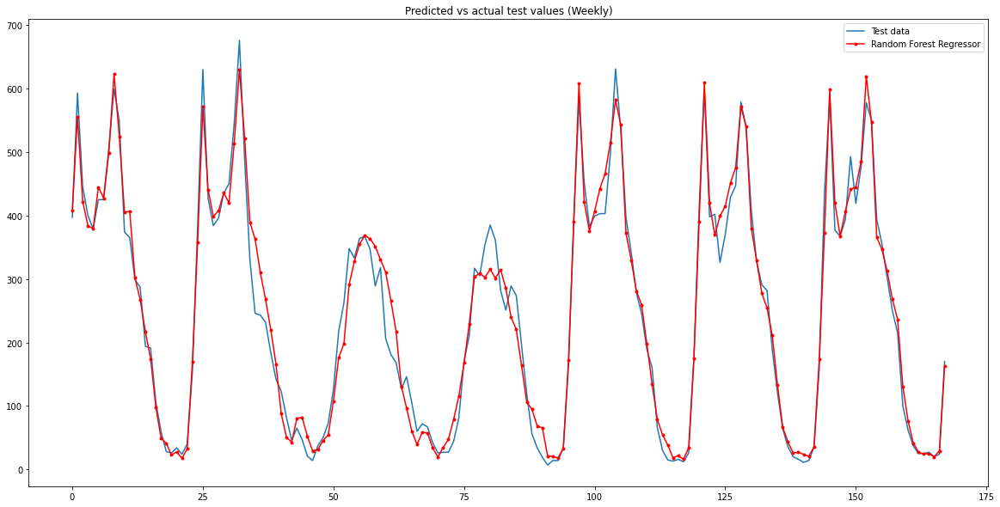

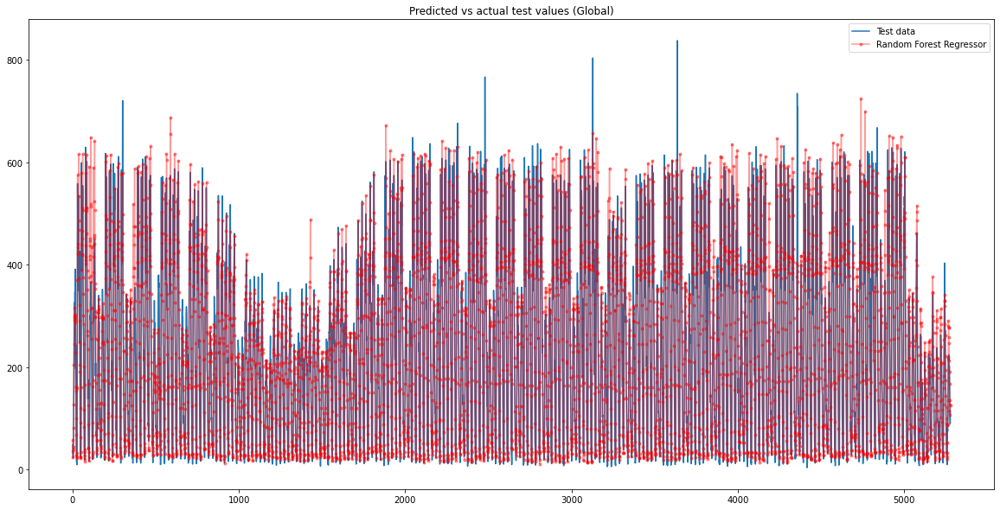

In [33]:
# Variables for plotting local patterns
week = 14
n_start = 100 + (week-1)*168
n_end = 100 + week*168

# Get predictions
y_predictions = best_RND_Forest.predict(X_modified_test)

# Make a figure with the predictions and validation data (local)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual test values (Weekly)')
plt.plot(y_test[n_start:n_end,2], label="Test data")
plt.plot(y_predictions[n_start:n_end], c="r", marker=".", label="Random Forest Regressor")
plt.legend()
plt.show()

# Make a figure with the predictions and validation data (global)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual test values (Global)')
plt.plot(y_test[:,2], label="Test data")
plt.plot(y_predictions[:], c="r", marker=".", label="Random Forest Regressor", alpha=0.4)
plt.legend()
plt.show()

In [34]:
score_test = best_RND_Forest.score(X_modified_test,y_test[:,2])

print('The best Random Forest Regressor model achieved a score of: ' + str(score_test) + ' on the test data.')

The best Random Forest Regressor model achieved a score of: 0.9250183137886531 on the test data.


Our selected model gets an astonishing score of 0.9250 on unseen data (the test data) for the total volume. This score is surprisingly larger than the validation score used in model selection. We know that validation score is supposed to be an overestimate of testing performance. One reason for this might be that since the dataset is not shuffled, the test dataset might be a bit simpler to predict for. A reason for this could perhaps be that the test data includes the big dip of the summer holidays. And since the summer holidays last a lot longer than any of the other holidays, then there will be more datapoints to associate with a lower traffic.

## 1.3.2 Model selection: Volume towards the center

### 1.3.2 a) LinearRegression()

We run the same cells as before, but we train and evaluate the model on the 0th column of y instead.

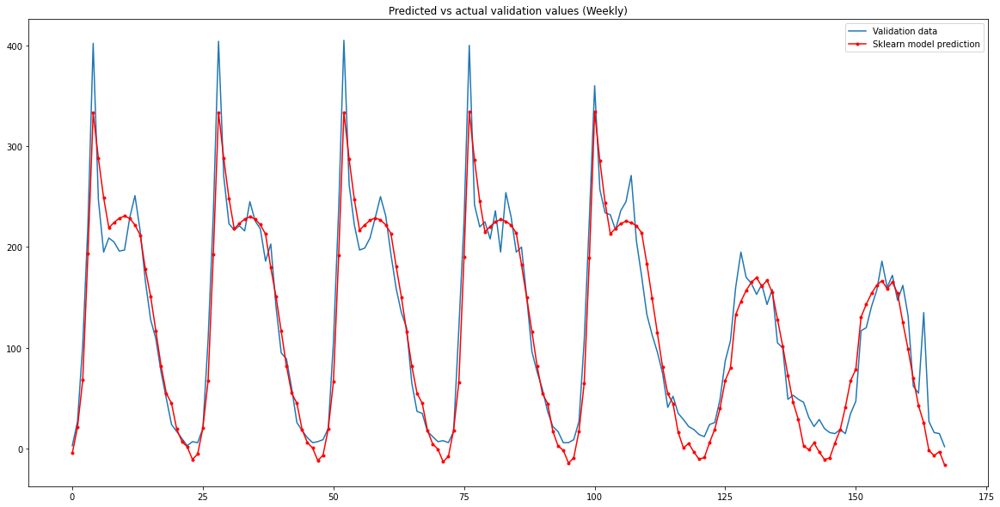

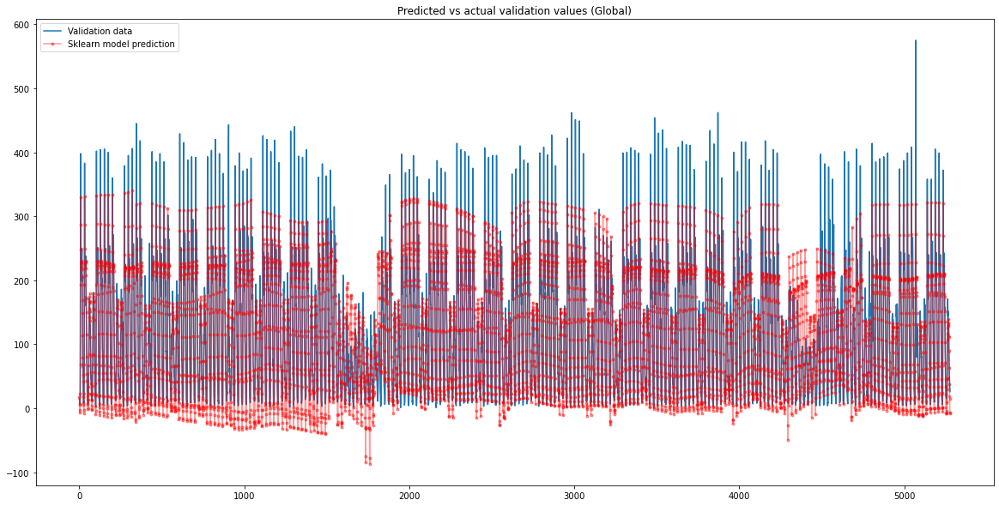

In [35]:
# Initialize a list of hyperparameters to vary
d_list = [1,2,3,4,5,6]

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,0]
y_val_coln = y_val[:,0]

# Loop through all of the hyperparameters and store each model in a list
for d in d_list:
        model_list.append(make_pipeline(PolynomialFeatures(d), LinearRegression()))
    
best_poly_model, best_poly_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [36]:
score = best_poly_model.score(X_modified_val,y_val[:,0])

print('The best polynomial model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_poly_model.get_params(deep=False)

The best polynomial model achieved a score of: 0.844094939968034
It achieved this score with the hyperparameters:


{'memory': None,
 'steps': [('polynomialfeatures', PolynomialFeatures(degree=5)),
  ('linearregression', LinearRegression())],
 'verbose': False}

We get a score of 0.8441 with the hyperparameter degree = 5.

### 1.3.2 b) Decision Tree Regressor

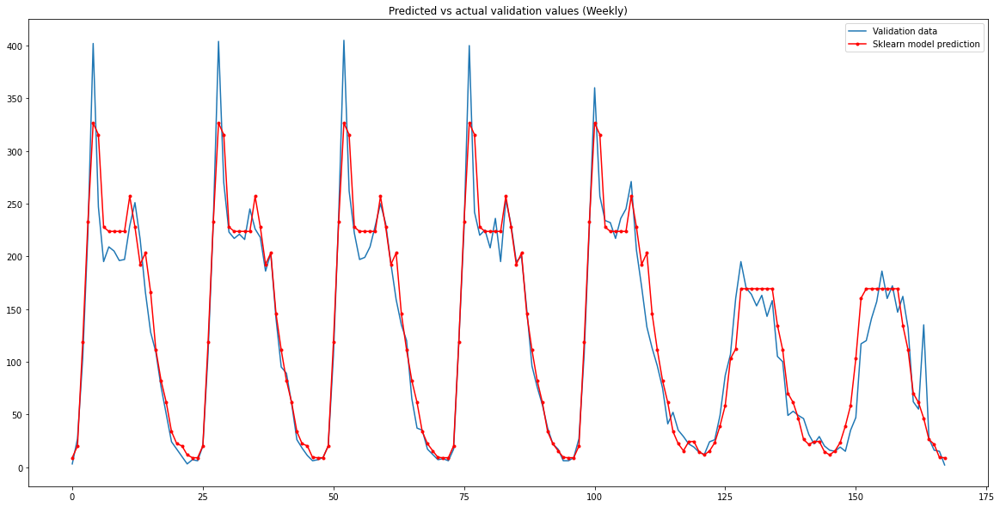

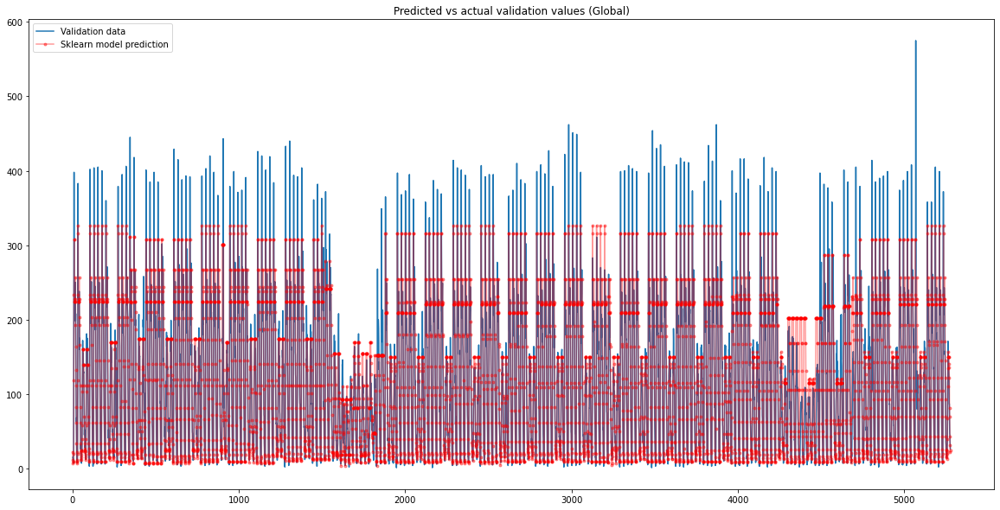

In [37]:
# Initialize a list of hyperparameters to vary
max_depth_list = [None, 500, 200, 100, 50, 20, 10, 8, 6, 4, 2]
  
# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,0]
y_val_coln = y_val[:,0]

# Loop through all of the hyperparameters and store each model in a list
for depth in max_depth_list:
        model_list.append(tree.DecisionTreeRegressor(max_depth = depth, random_state = 0))
    
best_DTR_model, best_DTR_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [38]:
score = best_DTR_model.score(X_modified_val,y_val[:,0])

print('The best Decision Tree Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_DTR_model.get_params(deep=False)

The best Decision Tree Regressor model achieved a score of: 0.8903687266761225
It achieved this score with the hyperparameters:


{'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 10,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': 0,
 'splitter': 'best'}

Here the decision tree regressor achieves a score of 0.8903 with the hyperparameter maximum depth = 10.

### 1.3.2 c) K Nearest Neighbor Regressor

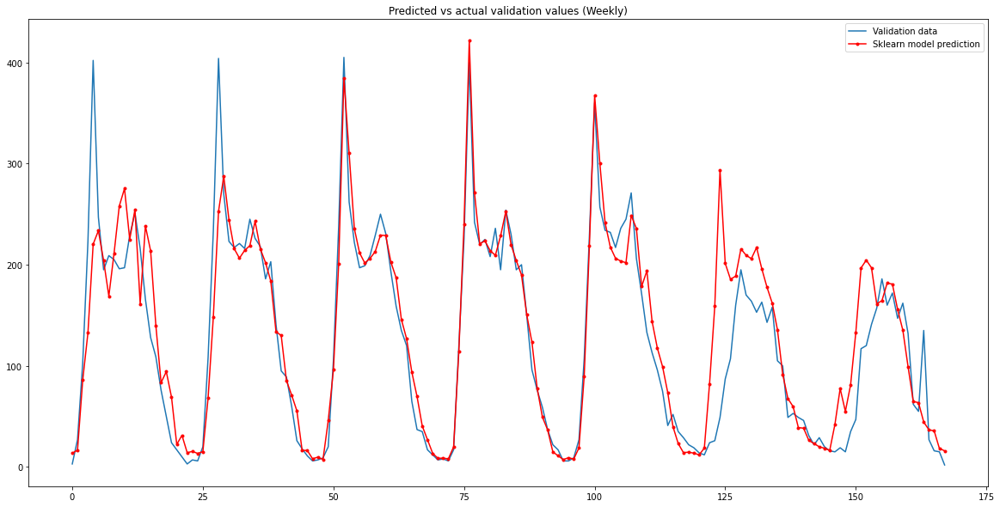

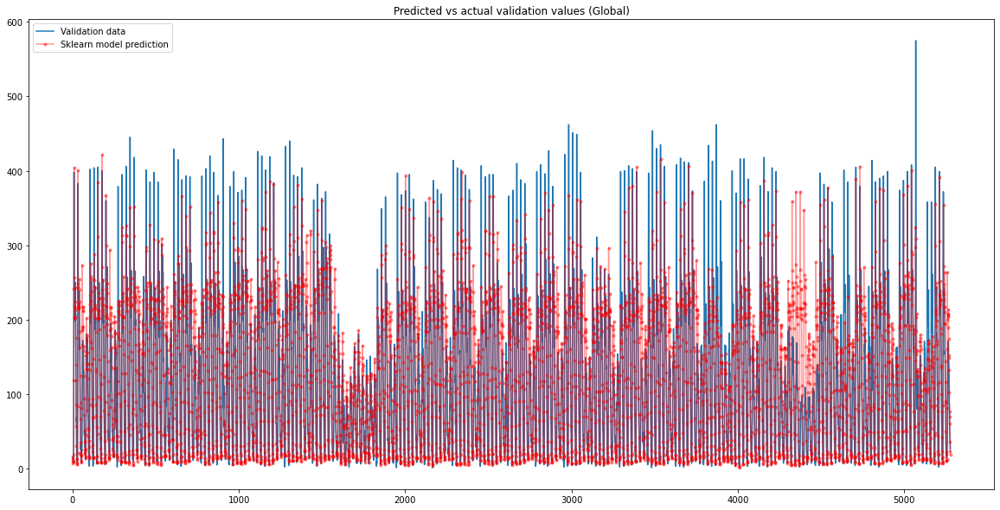

In [39]:
# Initialize a list of hyperparameters to vary
n_neighbors_list = [1, 2, 3, 4, 5, 10, 15, 20, 25]
weights_list = ['uniform', 'distance']

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,0]
y_val_coln = y_val[:,0]

# Loop through all of the hyperparameters and store each model in a list
for n in n_neighbors_list:
    for weight in weights_list:
        
        model_list.append(KNeighborsRegressor(n_neighbors=n, weights=weight))
    
best_KNNR_model, best_KNNR_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [40]:
score = best_KNNR_model.score(X_modified_val,y_val[:,0])

print('The best KNN Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_KNNR_model.get_params(deep=False)

The best KNN Regressor model achieved a score of: 0.7976278379003706
It achieved this score with the hyperparameters:


{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 3,
 'p': 2,
 'weights': 'distance'}

The KNN regressor achieves a score of 0.7977 with the hyperparameters number of neighbors = 3 and weights = distance.

### 1.3.2 d) Random Forest Regressor

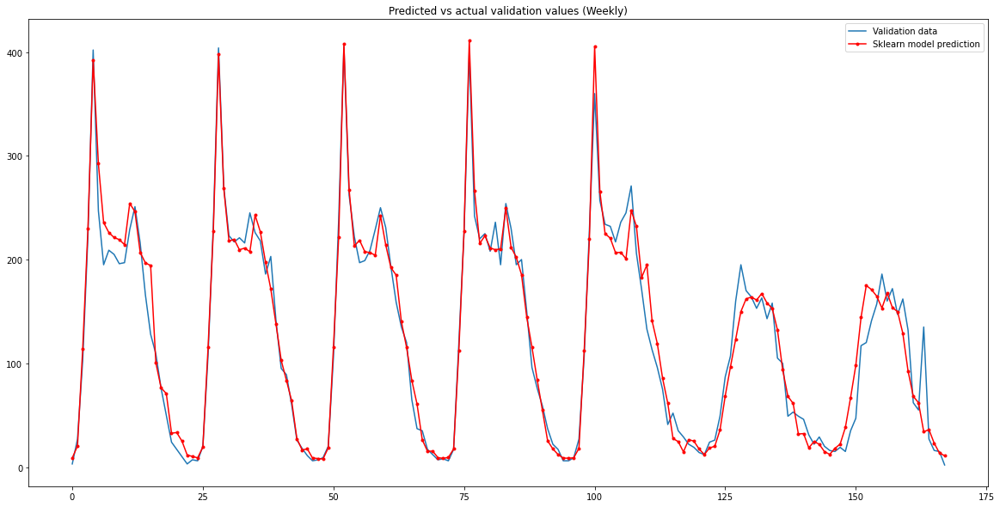

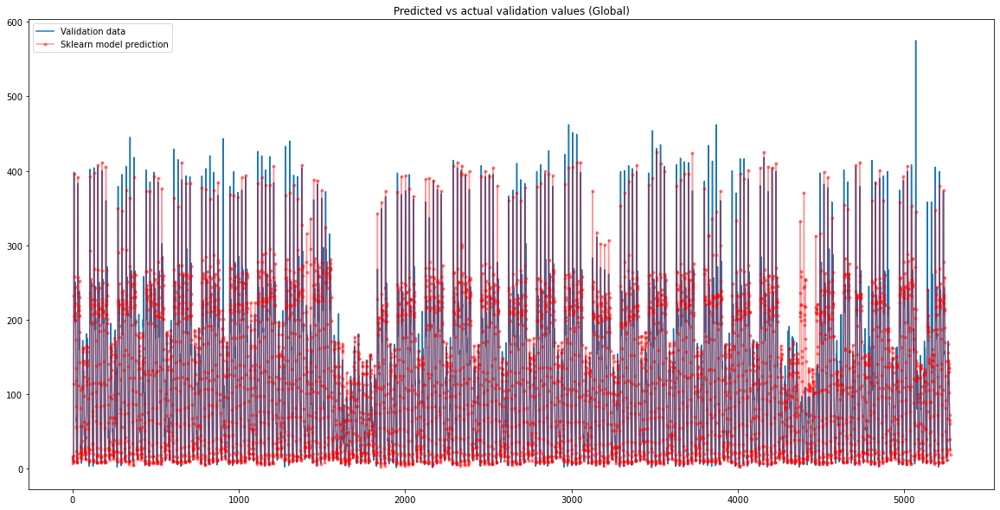

In [41]:
# Initialize a list of hyperparameters to vary
n_estimators_list = [25, 50, 100, 150, 200, 250]
max_depth_list = [5, 10, 20, 25, None]

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,0]
y_val_coln = y_val[:,0]

# Loop through all of the hyperparameters and store each model in a list
for n in n_estimators_list:
    for depth in max_depth_list:
    
        model_list.append(RandomForestRegressor(n_estimators=n, max_depth=depth, random_state=999))
    
best_RND_Forest, best_RND_Forest_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [42]:
score = best_RND_Forest.score(X_modified_val,y_val[:,0])

print('The best Random Forest Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_RND_Forest.get_params(deep=False)

The best Random Forest Regressor model achieved a score of: 0.9185178652377399
It achieved this score with the hyperparameters:


{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 20,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 999,
 'verbose': 0,
 'warm_start': False}

The random forest regressor achieves a score of 0.9185 with the hyperparameters number of estimators = 200 and maximum depth = 20.

## 1.3.2 e) The best overall model on volume towards the center

We can see that again, the best model is the Random Forest regressor with the hyper parameters n_estimators = 200 and max_depth = 20. This model had a score of 0.9185 on the validation data. I thus select this as my prefered model.

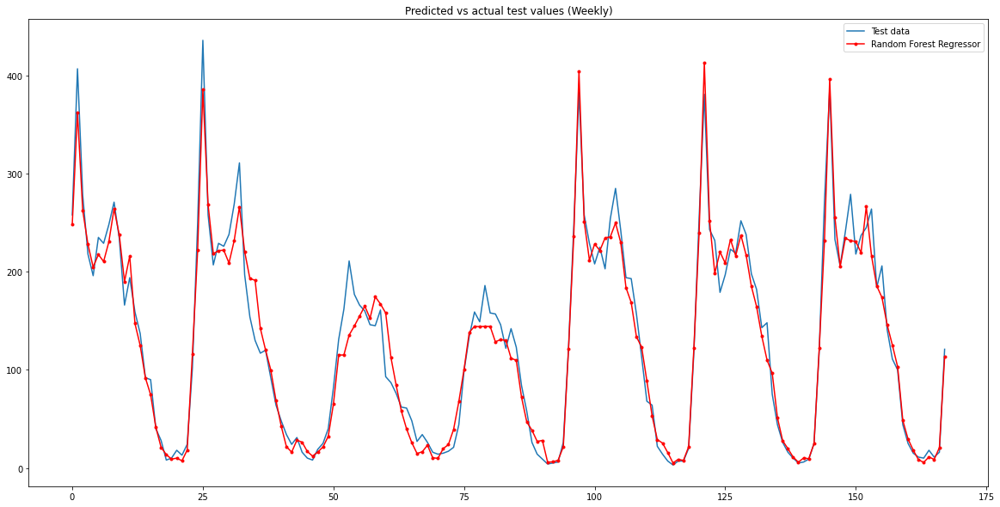

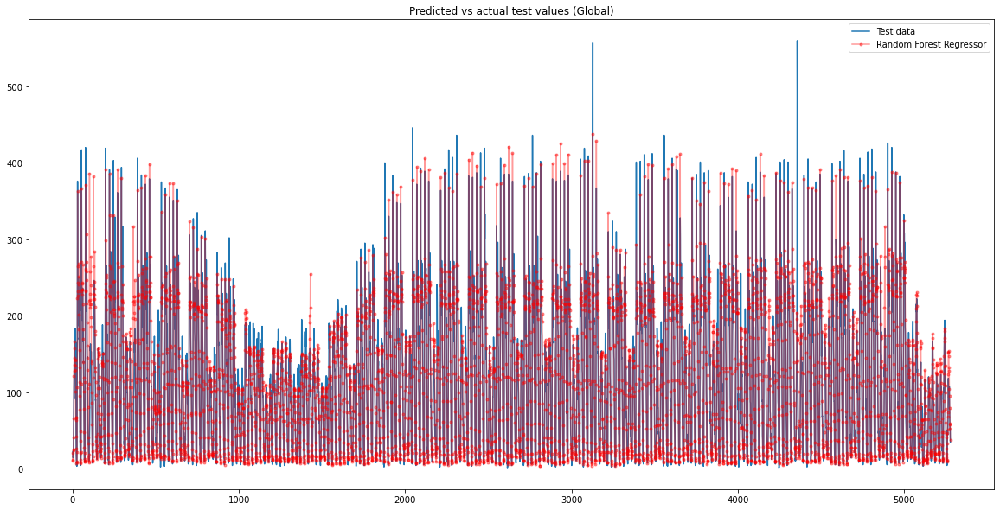

In [43]:
# Variables for plotting local patterns
week = 14
n_start = 100 + (week-1)*168
n_end = 100 + week*168

# Get predictions
y_predictions = best_RND_Forest.predict(X_modified_test)

# Make a figure with the predictions and validation data (local)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual test values (Weekly)')
plt.plot(y_test[n_start:n_end,0], label="Test data")
plt.plot(y_predictions[n_start:n_end], c="r", marker=".", label="Random Forest Regressor")
plt.legend()
plt.show()

# Make a figure with the predictions and validation data (global)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual test values (Global)')
plt.plot(y_test[:,0], label="Test data")
plt.plot(y_predictions[:], c="r", marker=".", label="Random Forest Regressor", alpha=0.4)
plt.legend()
plt.show()

In [44]:
score_test = best_RND_Forest.score(X_modified_test,y_test[:,0])

print('The best Random Forest Regressor model achieved a score of: ' + str(score_test) + ' on the test data.')

The best Random Forest Regressor model achieved a score of: 0.9296178545497278 on the test data.


The selected model has a score of 0.9296 on the unseen test data for the volume towards the center. The model also correctly predicts that the first sub-peak is larger than the second sub-peak. Saturdays and Sundays are also smaller peaks with no distinguishing sub-peaks. Note that in this specific case, the Saturday and Sunday peaks are the 3rd and 4th peak in the graph respectively. This is because the week has been offset after the split.

## 1.3.3 Model selection: Volume towards Danmarksplass

### 1.3.3 a) LinearRegression()

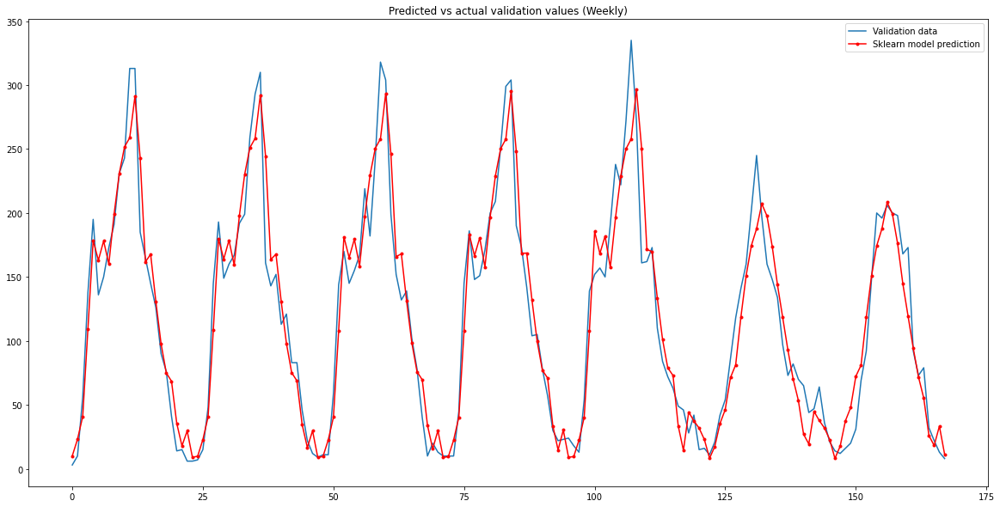

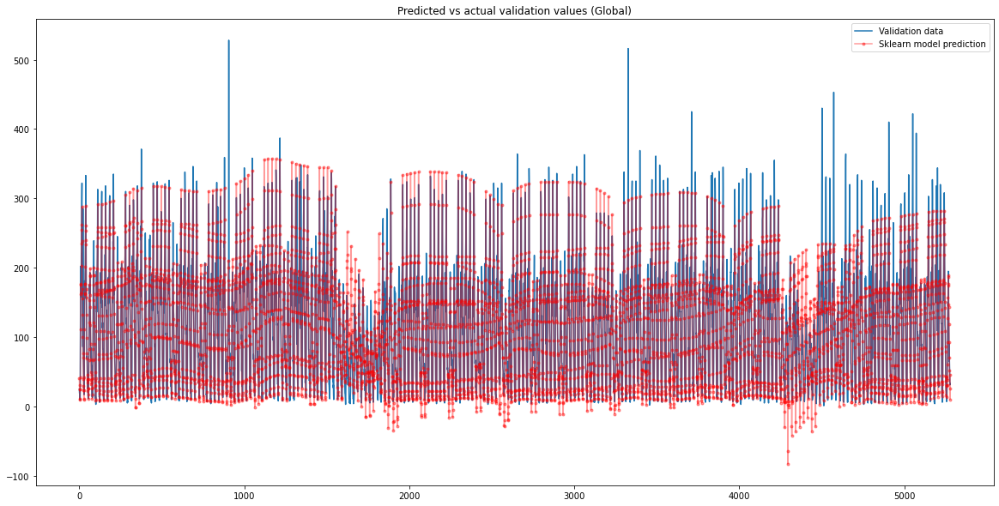

In [45]:
# Initialize a list of hyperparameters to vary
d_list = [1,2,3,4,5,6]

# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,1]
y_val_coln = y_val[:,1]

# Loop through all of the hyperparameters and store each model in a list
for d in d_list:
        model_list.append(make_pipeline(PolynomialFeatures(d), LinearRegression()))
    
best_poly_model, best_poly_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [46]:
score = best_poly_model.score(X_modified_val,y_val[:,1])

print('The best polynomial model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_poly_model.get_params(deep=False)

The best polynomial model achieved a score of: 0.8649173668120111
It achieved this score with the hyperparameters:


{'memory': None,
 'steps': [('polynomialfeatures', PolynomialFeatures(degree=5)),
  ('linearregression', LinearRegression())],
 'verbose': False}

We get a score of 0.8649 with the hyperparameter degree = 5.

### 1.3.3 b) Decision Tree Regressor

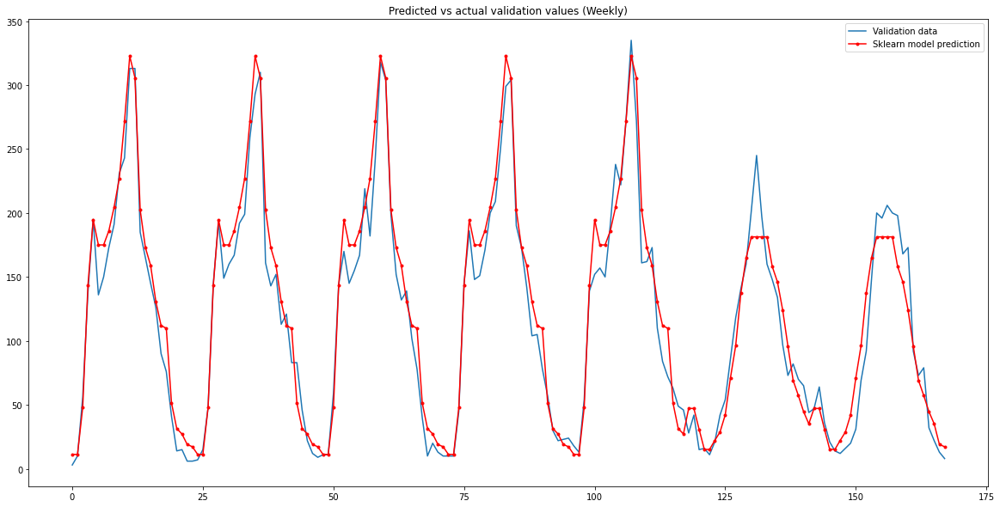

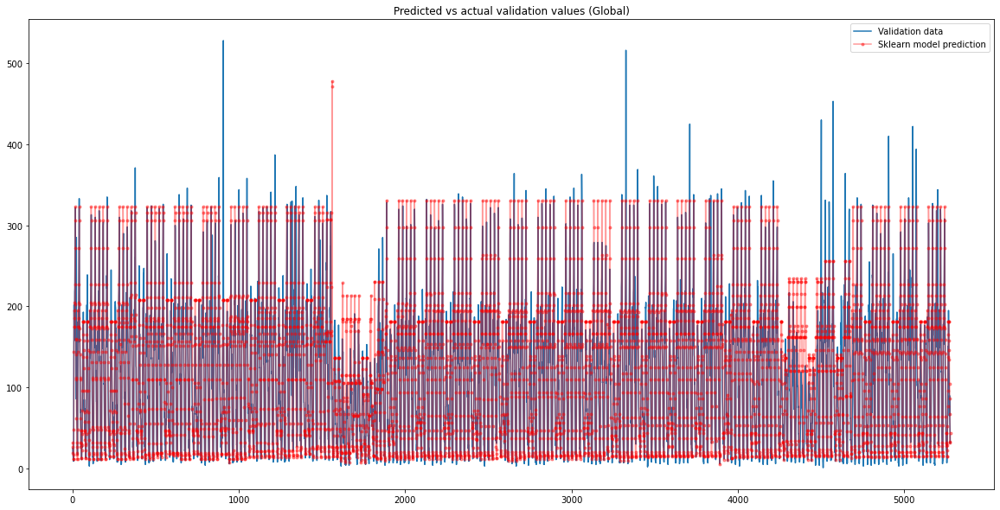

In [47]:
# Initialize a list of hyperparameters to vary
max_depth_list = [None, 500, 200, 100, 50, 20, 10, 8, 6, 4, 2]
   
# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,1]
y_val_coln = y_val[:,1]

# Loop through all of the hyperparameters and store each model in a list
for depth in max_depth_list:
        model_list.append(tree.DecisionTreeRegressor(max_depth = depth, random_state = 0))
    
best_DTR_model, best_DTR_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [48]:
score = best_DTR_model.score(X_modified_val,y_val[:,1])

print('The best Decision Tree Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_DTR_model.get_params(deep=False)

The best Decision Tree Regressor model achieved a score of: 0.8770480134288866
It achieved this score with the hyperparameters:


{'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 10,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': 0,
 'splitter': 'best'}

The decision tree regressor achieves a score of 0.8770 with the hyperparameters maximum depth = 10.

### 1.3.3 c) K Nearest Neighbors Regressor

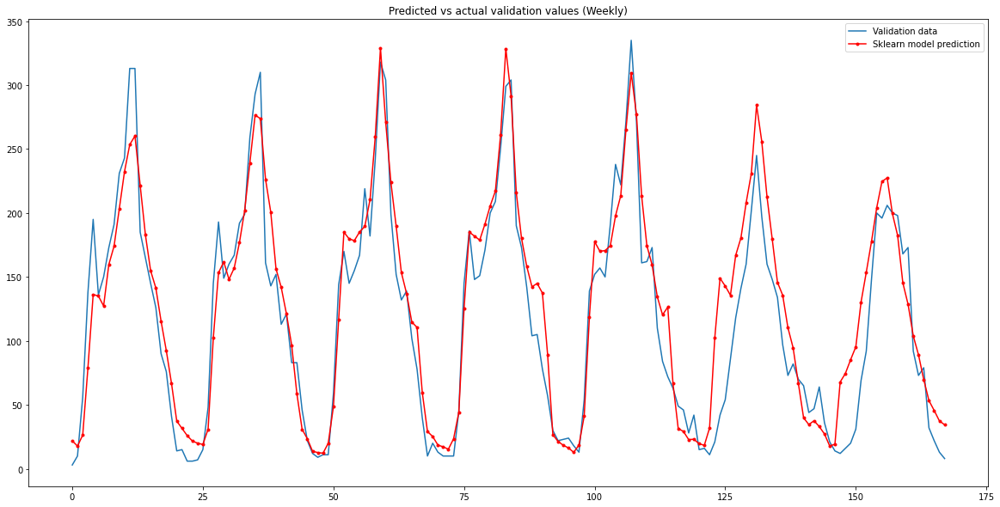

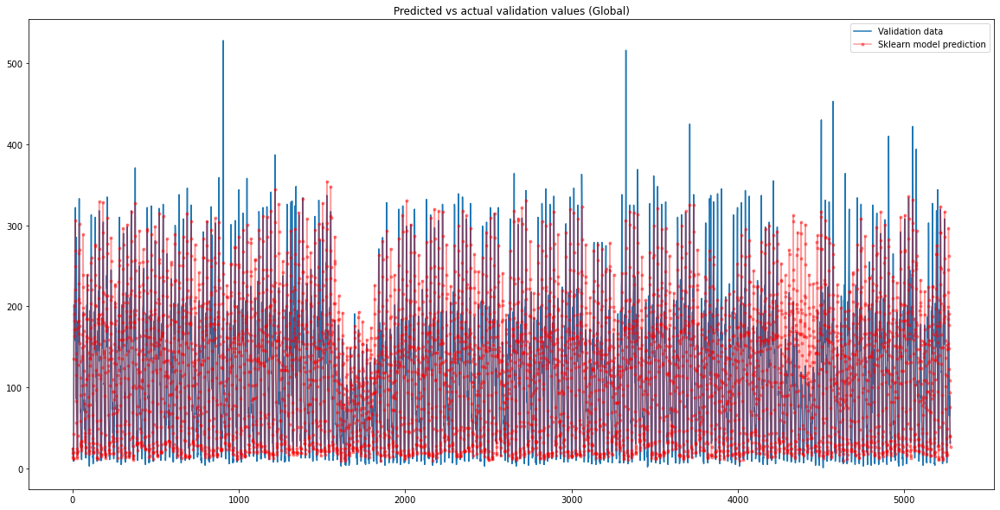

In [49]:
# Initialize a list of hyperparameters to vary
n_neighbors_list = [1, 2, 3, 4, 5, 10, 15, 20, 25]
weights_list = ['uniform', 'distance']
 
# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,1]
y_val_coln = y_val[:,1]

# Loop through all of the hyperparameters and store each model in a list
for n in n_neighbors_list:
    for weight in weights_list:
        
        model_list.append(KNeighborsRegressor(n_neighbors=n, weights=weight))
    
best_KNNR_model, best_KNNR_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [50]:
score = best_KNNR_model.score(X_modified_val,y_val[:,1])

print('The best KNN Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_KNNR_model.get_params(deep=False)

The best KNN Regressor model achieved a score of: 0.8134770264708939
It achieved this score with the hyperparameters:


{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 10,
 'p': 2,
 'weights': 'distance'}

The KNN regressor achieves a score of 0.8135 with the hyperparameter number of neighbors = 10 and weights = distance.

### 1.3.3 d) Random Forest Regressor

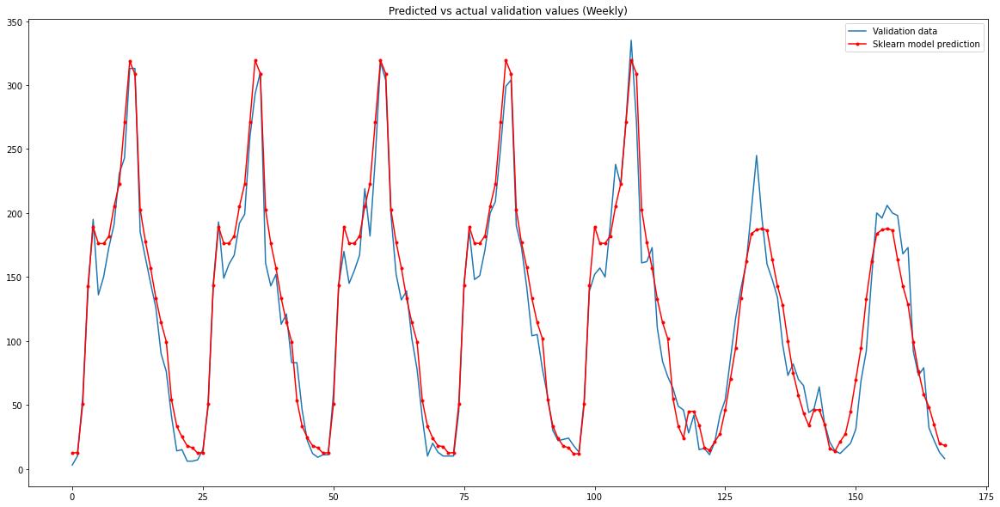

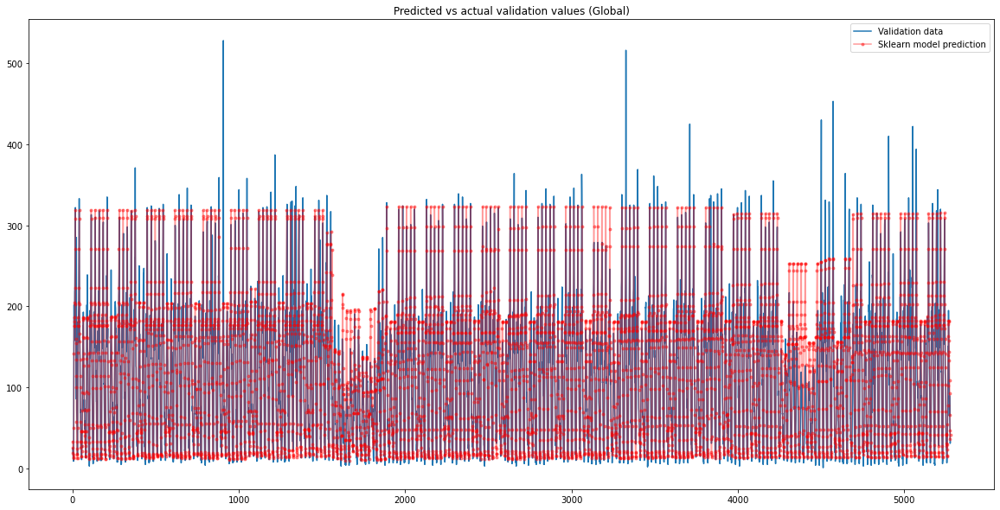

In [51]:
# Initialize a list of hyperparameters to vary
n_estimators_list = [25, 50, 100, 150, 200, 250]
max_depth_list = [5, 10, 20, 25, None]
   
# Initialize the model list
model_list = []

# Extract the targets we are going to train/evaluate with
y_train_coln = y_train[:,1]
y_val_coln = y_val[:,1]

# Loop through all of the hyperparameters and store each model in a list
for n in n_estimators_list:
    for depth in max_depth_list:
    
        model_list.append(RandomForestRegressor(n_estimators=n, max_depth=depth, random_state=999))
    
best_RND_Forest, best_RND_Forest_score = train_eval_plot_model(model_list, X_modified_train, y_train_coln, X_modified_val, y_val_coln)

In [52]:
score = best_RND_Forest.score(X_modified_val,y_val[:,1])

print('The best Random Forest Regressor model achieved a score of: ' + str(score))
print('It achieved this score with the hyperparameters:')
best_RND_Forest.get_params(deep=False)

The best Random Forest Regressor model achieved a score of: 0.8910185916093275
It achieved this score with the hyperparameters:


{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 10,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 50,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 999,
 'verbose': 0,
 'warm_start': False}

The Random Forest Regressor achieves a score of 0.8910 with the hyperparameters number of estimators = 50 and maximum depth = 10.

## 1.3.3 e) The best overall model on volume towards Danmarksplass

Again, the best model is the Random Forest Regression model. However this time the number of estimators were 50 and the maximum depth was 10.

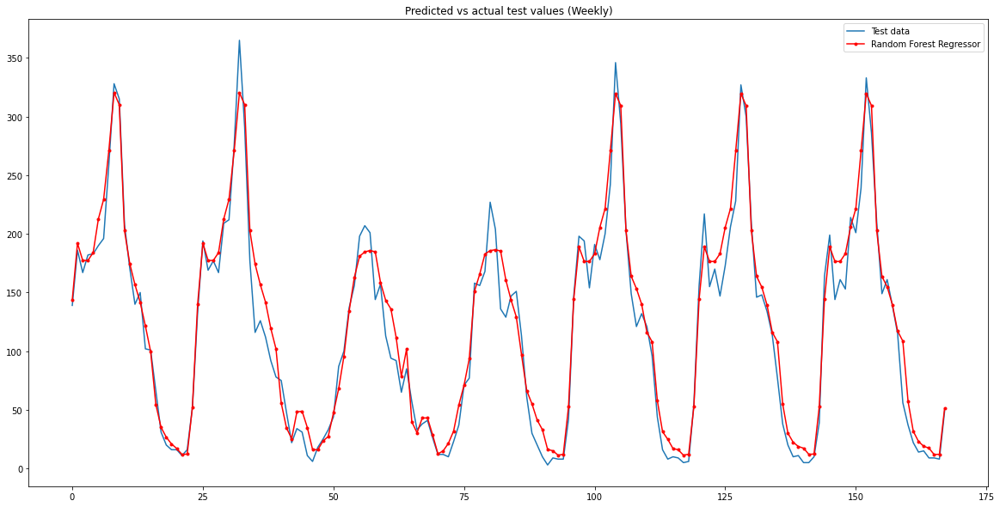

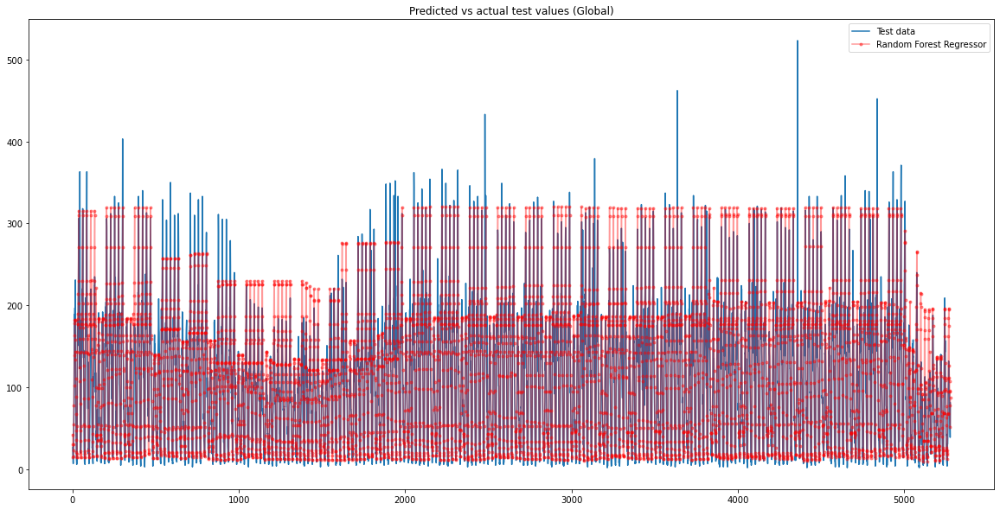

In [53]:
# Variables for plotting local patterns
week = 14
n_start = 100 + (week-1)*168
n_end = 100 + week*168

# Get predictions
y_predictions = best_RND_Forest.predict(X_modified_test)

# Make a figure with the predictions and validation data (local)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual test values (Weekly)')
plt.plot(y_test[n_start:n_end,1], label="Test data")
plt.plot(y_predictions[n_start:n_end], c="r", marker=".", label="Random Forest Regressor")
plt.legend()
plt.show()

# Make a figure with the predictions and validation data (global)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual test values (Global)')
plt.plot(y_test[:,1], label="Test data")
plt.plot(y_predictions[:], c="r", marker=".", label="Random Forest Regressor", alpha=0.4)
plt.legend()
plt.show()

In [54]:
score_test = best_RND_Forest.score(X_modified_test,y_test[:,1])

print('The best Random Forest Regressor model achieved a score of: ' + str(score_test) + ' on the test data.')

The best Random Forest Regressor model achieved a score of: 0.8704053299460695 on the test data.


The selected model has a score of 0.8704 on the unseen test data for the volume towards Danmarksplass. This model correctly predicts that the second sub-peak is larger than the first. It also is able to predict the dip of the summer holiday.

# 1.3.4 Evaluating my model on the 2020 dataset

Now that we have a best model for all the 3 different target values, we want to deploy them on the 2020 dataset. I load the 2020 dataset similarly to before.

In [55]:
# Load the 2020 dataset as a pandas dataframe
dataset_2020 = pd.read_csv('data_2020.csv')

# Extract features to a pandas dataframe X_2020 then convert to a numpy array
X_2020 = dataset_2020.iloc[:,:-3].to_numpy()

# Extract features to a pandas dataframe y_2020 then convert to a numpy array
y_2020 = dataset_2020.iloc[:,-3:].to_numpy()

print('Number of samples: ', X_2020.shape[0])
print('Number of features: ', X_2020.shape[-1])
print('Number of targets: ', y_2020.shape[-1])

Number of samples:  5230
Number of features:  4
Number of targets:  3


We see that the 2020 dataset is of similar form as the previous dataset.

In [56]:
print(dataset_2020)

        År  Måned  Dag  Fra_time  Volum til SNTR  Volum til DNP  Volum totalt
0     2020      1    1         0              58             59           117
1     2020      1    1         1              44             48            92
2     2020      1    1         2              36             42            78
3     2020      1    1         3              34             21            55
4     2020      1    1         4              28             19            47
...    ...    ...  ...       ...             ...            ...           ...
5225  2020      8    5        17             133            138           271
5226  2020      8    5        18             141            133           274
5227  2020      8    5        19              81             76           157
5228  2020      8    5        20              64             71           135
5229  2020      8    5        21              47             30            77

[5230 rows x 7 columns]


I run the feature matrix X_2020 through the onehot encoder to add the extra features.

In [57]:
X_modified_2020 = modify_features_onehot(X_2020)

I retrain the best models seperately

In [58]:
best_RND_Forest_total = RandomForestRegressor(n_estimators=200, max_depth=20, random_state=999)
best_RND_Forest_total.fit(X_modified_train, y_train[:,2])

RandomForestRegressor(max_depth=20, n_estimators=200, random_state=999)

In [59]:
best_RND_Forest_center = RandomForestRegressor(n_estimators=200, max_depth=20, random_state=999)
best_RND_Forest_center.fit(X_modified_train, y_train[:,0])

RandomForestRegressor(max_depth=20, n_estimators=200, random_state=999)

In [60]:
best_RND_Forest_DNMKP = RandomForestRegressor(n_estimators=50, max_depth=10, random_state=999)
best_RND_Forest_DNMKP.fit(X_modified_train, y_train[:,1])

RandomForestRegressor(max_depth=10, n_estimators=50, random_state=999)

I will now evaluate and plot the predicted vs actual values for the 2020 dataset for all three targets. 

## 1.3.4 a) Evaluation and plotting for total volume 2020

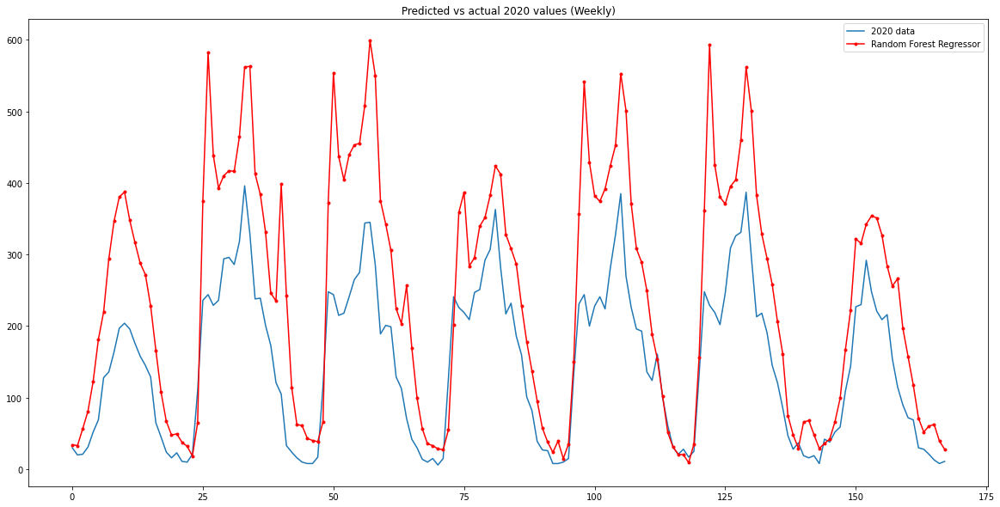

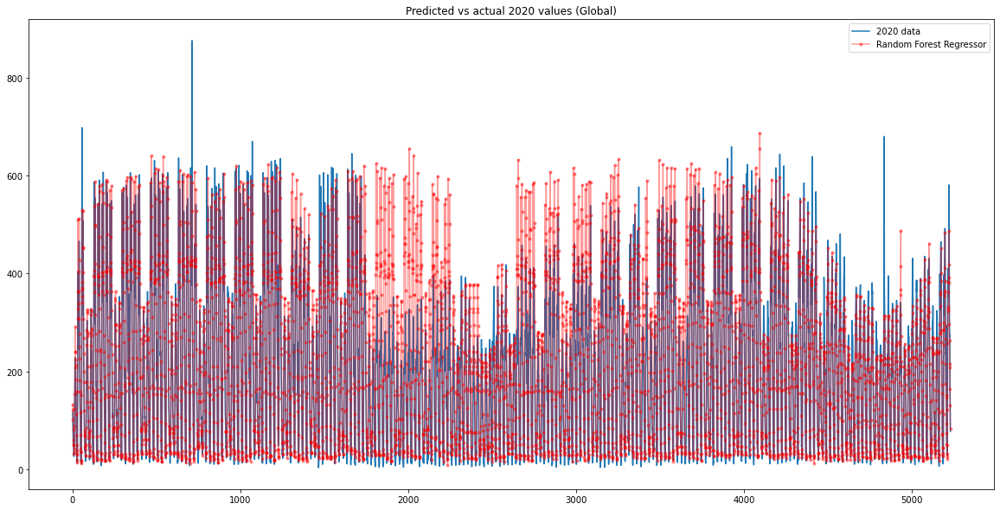

In [61]:
# Variables for plotting local patterns
week = 13
n_start = 100 + (week-1)*168
n_end = 100 + week*168

# Get predictions
y_predictions = best_RND_Forest_total.predict(X_modified_2020)

# Make a figure with the predictions and validation data (local)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual 2020 values (Weekly)')
plt.plot(y_2020[n_start:n_end,2], label="2020 data")
plt.plot(y_predictions[n_start:n_end], c="r", marker=".", label="Random Forest Regressor")
plt.legend()
plt.show()

# Make a figure with the predictions and validation data (global)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual 2020 values (Global)')
plt.plot(y_2020[:,2], label="2020 data")
plt.plot(y_predictions[:], c="r", marker=".", label="Random Forest Regressor", alpha = 0.4)
plt.legend()
plt.show()

In [62]:
score_2020_total = best_RND_Forest_total.score(X_modified_2020, y_2020[:,2])

print('The best Random Forest Regressor model achieved a score of: ' + str(score_2020_total) + ' on the 2020 dataset (total volume).')

The best Random Forest Regressor model achieved a score of: 0.8084384772400769 on the 2020 dataset (total volume).


For the total volume, the model gets a score of 0.8084, which is quite a bit worse than expected.

## 1.3.4 b) Evaluation and plotting for volume towards center 2020

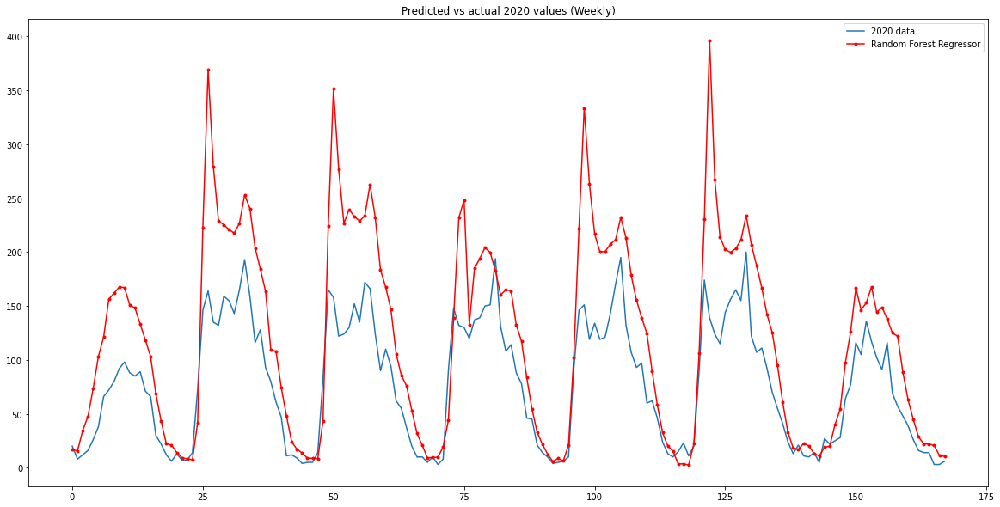

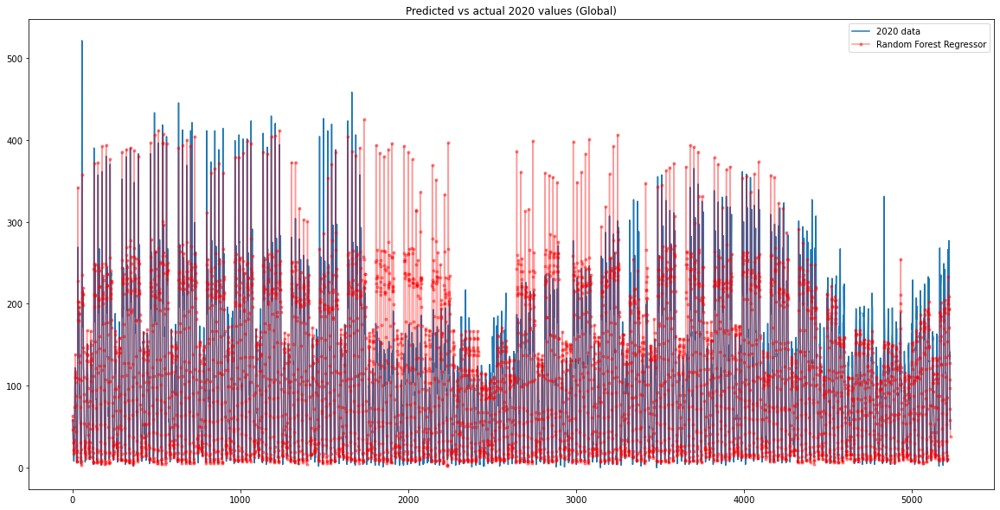

In [63]:
# Variables for plotting local patterns
week = 13
n_start = 100 + (week-1)*168
n_end = 100 + week*168

# Get predictions
y_predictions = best_RND_Forest_center.predict(X_modified_2020)

# Make a figure with the predictions and validation data (local)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual 2020 values (Weekly)')
plt.plot(y_2020[n_start:n_end,0], label="2020 data")
plt.plot(y_predictions[n_start:n_end], c="r", marker=".", label="Random Forest Regressor")
plt.legend()
plt.show()

# Make a figure with the predictions and validation data (global)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual 2020 values (Global)')
plt.plot(y_2020[:,0], label="2020 data")
plt.plot(y_predictions[:], c="r", marker=".", label="Random Forest Regressor", alpha = 0.4)
plt.legend()
plt.show()

In [64]:
score_2020_center = best_RND_Forest_center.score(X_modified_2020, y_2020[:,0])

print('The best Random Forest Regressor model achieved a score of: ' + str(score_2020_center) + ' on the 2020 dataset (center).')

The best Random Forest Regressor model achieved a score of: 0.8294054359764303 on the 2020 dataset (center).


For the volume towards the center, the model gets a score of 0.8294.

## 1.3.4 c) Evaluation and plotting for volume towards Danmarksplass 2020

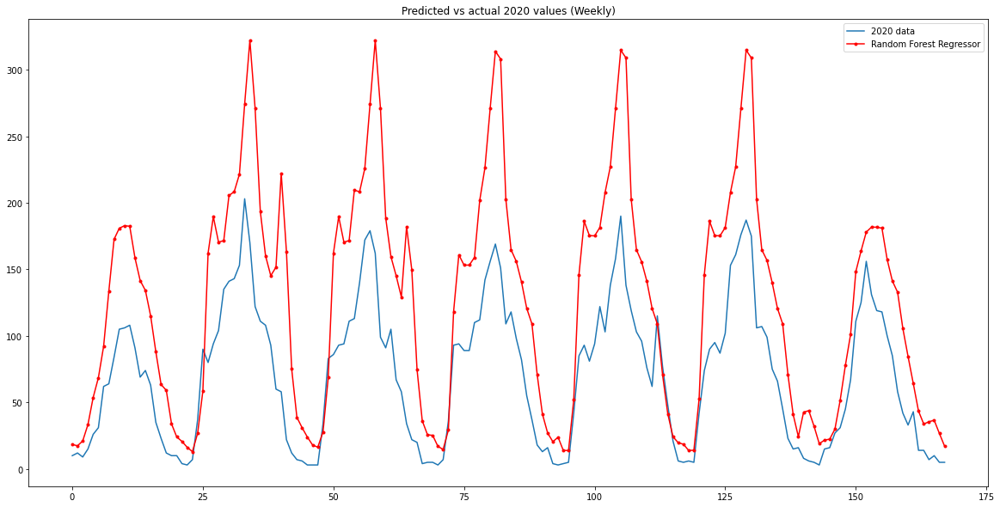

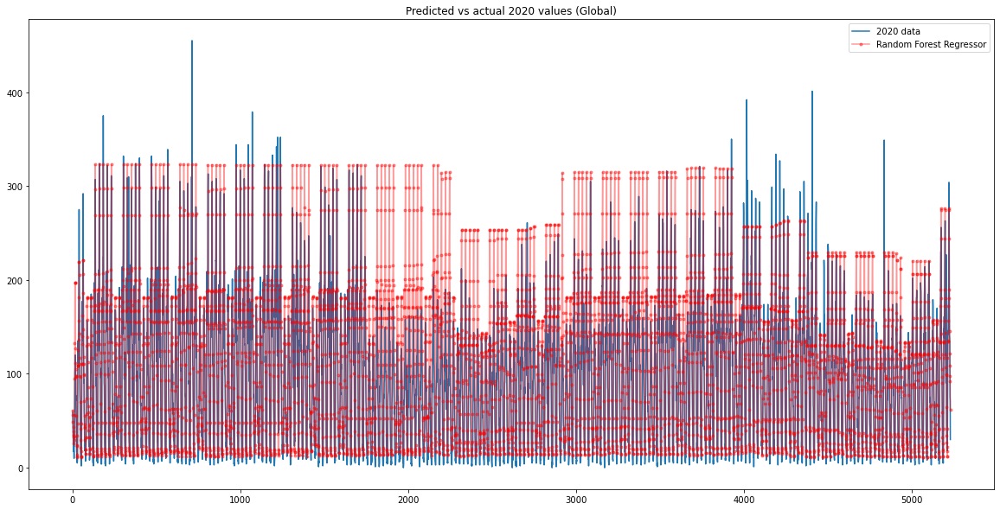

In [65]:
# Variables for plotting local patterns
week = 13
n_start = 100 + (week-1)*168
n_end = 100 + week*168

# Get predictions
y_predictions = best_RND_Forest_DNMKP.predict(X_modified_2020)

# Make a figure with the predictions and validation data (local)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual 2020 values (Weekly)')
plt.plot(y_2020[n_start:n_end,1], label="2020 data")
plt.plot(y_predictions[n_start:n_end], c="r", marker=".", label="Random Forest Regressor")
plt.legend()
plt.show()

# Make a figure with the predictions and validation data (global)
plt.figure(figsize=(20,10))

plt.title('Predicted vs actual 2020 values (Global)')
plt.plot(y_2020[:,1], label="2020 data")
plt.plot(y_predictions[:], c="r", marker=".", label="Random Forest Regressor", alpha = 0.4)
plt.legend()
plt.show()

In [66]:
score_2020_DNMKP = best_RND_Forest_DNMKP.score(X_modified_2020, y_2020[:,1])

print('The best Random Forest Regressor model achieved a score of: ' + str(score_2020_DNMKP) + ' on the 2020 dataset (Danmarksplass).')

The best Random Forest Regressor model achieved a score of: 0.7364265196804303 on the 2020 dataset (Danmarksplass).


And finally, for the volume towards the center the best model achieves a score of 0.7364.

Here we see that the model does a bit worse on the 2020 dataset than expected. The reason for this is that the estimator greatly overestimates the traffic during the lockdown of the 2020 COVID-19 pandemic. The first 11 weeks before lockdown, we can see that the estimator does very well and accurately predicts the traffic as expected. However once lockdown hits, it overestimates traffic by a lot. Curiously there is a sudden dip in the predicted values for the 15th and 16th week. This is because that the Easter holiday occurs in that period, and our models will try to account for that. Once the Easter holiday is over, it starts overestimating again until the start of the summer holiday.

Note: The local plots are of a week within the COVID-19 lockdown, as I wanted to show how the models are overestimating the traffic.

We have learnt that despite having all this data to train on, our models can not predict abrupt changes due to unforseen events which have not been accounted for in the training data. We have also seen the benefit of ensemble methods. The random forest regressor won out every single time. The general nature of a decision tree usually leads to overfitting, but with having several 'lower-quality' trees we can have a better generalized performance because we base our prediction on the majority rule.